# Hack My Ride Project

**INFOH423 - Data Mining**

**December 2021**

**Group Members:**
* Andrés Espinal (000512748)
* Diogo Repas (000539235)
* Niccolò Morabito (000541608)
* Nicole Kovacs (000509618)

## Introduction

STIB-MVIB is the company that provides public transport in the city of Brussels in Belgium. It has an [open data portal](https://opendata.stib-mivb.be) that provides data on trip scheduling and real-time vehicle arrival times for buses, trams and metros. We were provided three weeks of data (from September 6th to September 21st) with the following information:
- The location of all vehicles every +-30 seconds, encoded in JSON
- Esri Shape files describing the map (lines and stops) of stib-mivb network
- GTFS files containing the offline plan/schedule covering the same period of the vehicle location data
- GPS tracks from two users of the STIB-MVIB network

The team was challenged to analyse the data described and provide the follwing insights:
1. Analyze the vehicle speed over the different network segments, how it varies across segments and over time. Present this in a suitable visual way.
2. Analyze the vehicle delays at the different stops, how it varies across stops, and over time. Present this in a suitable visual way.
3. Given a vehicle start time, do arrival time forecasting at a given stop in the route of this vehicle. You should be able to test the accuracy of your forecasting by randomly splitting the given dataset in disjoint training and testing subsets.
4. The GPS tracks are for real people moving in Brussels. You are asked to infer the mode of transport of each of these tracks (bus, tram, etc)

## Data Pre-Processing

Due to the volume of data that needs to be processed, a relational database was required in order to wrangle the data efficiently. Using a database to perform the first part of data processing proved to be more efficient than doing it in python.

We started by importing the data to a SQL Server Express instance through `BULK INSERT` statements and a combination of CSV/TXT files. *GTFS Files* were imported as TXT files and the *JSON Position Files* were initially parsed as CSV through a bash script before importing them in the database. 

### **Step 1:** Parse position JSON files into CSV

In order to perform data wrangling, having everything parsed into a relational schema is required. JSON files are not structured by nature so we needed to transform this files into a *flat* or *relational schema (which basically means each observation has the same amount of attributes)*.

After an attempt of doing this in python we noticed the script took a long time to process. As an alternative we ended up using a *bash script* to transform the JSON files into a single CSV file containing all the position data. The script uses the `jq` utility to parse each of the JSON files individually, generate a CSV file per each and then merge everything into one single CSV file. The bash script is shown below. 

```sh
#!/bin/bash

cd data/original
for filename in vehiclePosition*.json; do
    outfile=${filename%.json}.csv
    echo Parsing file $filename and writing to $outfile
    time jq -cr '
    [
        .data[] | .time as $timestamp | 
        .Responses? + .responses? | .[]?.lines[]? | .lineId as $lineId | 
        .vehiclePositions[]? |
        {
            directionId: .directionId | tonumber,
            distanceFromPoint: .distanceFromPoint,
            pointId: .pointId | tonumber,
            lineId: $lineId | tonumber,
            timestamp: $timestamp | tonumber
        }
    ] |
    ["directionId", "distanceFromPoint", "pointId", "lineId", "timestamp"] as $cols | 
    map(. as $row | $cols | map($row[.])) as $rows | 
    $rows[] | @csv
    ' $filename > ../parsed/$outfile
done
cd ../parsed
echo '"directionId","distanceFromPoint","pointId","lineId","timestamp"' | cat - vehiclePosition*.csv > positions.csv
rm vehiclePosition*.csv
cd ../..
```

### **Step 2:** Create intermediate tables

Creating *materialized tables* to pre-process data step by steps was our first strategy to be able to wrangle the data efficiently. This strategy helps improve the performance of queries and allows us to create *indexes* on the tables to further optimize query execution times. All this intermediate tables were organized into a schema called `staging`.

```sql
-- DDL
CREATE SCHEMA staging;
GO

CREATE TABLE staging.calendar(
    service_id INT
    , [start_date] DATE
    , [end_date] DATE
    , day_of_week NVARCHAR(250)
)
GO


CREATE TABLE staging.positions(
    route_id INT
    , stop_id INT
    , [time] TIME
    , direction_id INT
    , [date] DATE
    , day_of_week NVARCHAR(450)
)
GO
CREATE TABLE staging.stop_time(
    trip_id NVARCHAR(20)
    , stop_sequence INT
    , stop_id NVARCHAR(20)
    , [time] TIME
    , direction_id NVARCHAR(20)
)

CREATE TABLE staging.positions_parsed(
    p_key INT IDENTITY
    , s_key INT
    , trip_id NVARCHAR(20)
    , stop_sequence INT
    , [date] DATE
    , [time] TIME
    , day_of_week NVARCHAR(250)
    , route_id NVARCHAR(20)
    , stop_id INT
    , direction_id INT
    , diff INT
)

CREATE TABLE staging.positions_parsed2(
    s_key INT
    , trip_id NVARCHAR(20)
    , stop_sequence INT
    , [date] DATE
    , [time] TIME
    , day_of_week NVARCHAR(250)
    , route_id NVARCHAR(20)
    , stop_id INT
    , direction_id INT
    , diff INT
)

CREATE TABLE staging.route (
    route_id VARCHAR(20)
    , route_short_name VARCHAR(20)
)
```

### **Step 3:** Create indexes for intermediate tables

Most of the queries needed to pre-process the data require some sort of *join* or *filtering operation*. These are operations that benefit a lot from indexes. We decided to create several non-clustered indexes to speed up query execution times. In general, columns involved in joins and filter operations were handpicked as candidates for indexing. The indexes created are shown below:

```sql
-- staging.calendar
CREATE NONCLUSTERED INDEX ix_calendar ON staging.calendar( service_id, start_date, end_date, day_of_week )

-- dbo.trip
CREATE NONCLUSTERED INDEX ix_trip ON dbo.trip( route_id, service_id )

-- staging.positions	
CREATE NONCLUSTERED INDEX ix_positions ON staging.positions( route_id, stop_id, date, day_of_week )

 staging.positions_parsed
CREATE NONCLUSTERED INDEX ix_positions_parsed ON staging.positions_parsed( route_id )

-- staging.stop_time
CREATE NONCLUSTERED INDEX ix_stop_time ON staging.stop_time( trip_id, stop_id )

CREATE NONCLUSTERED INDEX ix_stop_time ON staging.stop_time( trip_id )

CREATE NONCLUSTERED INDEX ix_stop_time_2 ON staging.stop_time( stop_id, direction_id )
```

### **Step 4:** Materialize intermediate tables

Now that we have the playground ready, we can start materializing the intermediate tables. Common Table Expressions (CTE's) were used at convenience. All materialization is performed through `INSERT INTO <Table I> SELECT <Columns> FROM <Table S>` statements, as detailed below.

Due to the huge volume of data generated through these operations and the fact that it takes a lot of time to acquire results, the following routes where filtered:
5 (Tram), 6 (Tram), 1 (Metro), 2 (Metro), 7 (Bus), 51 (Bus), 95 (Bus), 81 (Bus)

```sql
-- Melt operation on the calendar table: This is equivalent to an unpivot operation and allows us to get a long table with a single column specifying the day of the week (As opposed to having 7 binary flags)
WITH calendar_unpivoted AS (
    SELECT service_id, [start_date], end_date, day_of_week
    FROM (
        SELECT service_id, [start_date], end_date, monday, tuesday, wednesday, thursday, friday, saturday, sunday  
        FROM dbo.calendar
    ) p  
    UNPIVOT  
    ( day_of_week_flag FOR day_of_week IN   
        ( monday, tuesday, wednesday, thursday, friday, saturday, sunday )  
    ) AS unpvt
    WHERE day_of_week_flag = 1

)

INSERT INTO [staging].[calendar]
    SELECT * FROM calendar_unpivoted;

UPDATE staging.calendar
SET day_of_week = 'sunday'
WHERE (start_date = '2021-09-12' AND end_date = '2021-09-12') OR  (start_date = '2021-09-19' AND end_date = '2021-09-19')

-- Routes: Remove letters from the route and clean weird values
INSERT INTO staging.route
SELECT route_id
    , CASE WHEN PATINDEX( '%[A-Z]%', R.route_short_name  ) = 0 THEN R.route_short_name  
        ELSE RIGHT( R.route_short_name , LEN( R.route_short_name )- ( PATINDEX( '%[A-Z]%', R.route_short_name  ) ) )
    END AS route_short_name
FROM dbo.route R
WHERE R.route_short_name <> 'NAV'

-- Positions: Transformations to acquire dates and day of week. If service spanned more than one day the dates were adjusted.
WITH positions_parsed_1 AS (
SELECT *, DATEADD(SECOND, [time]/1000, '1970-01-01 00:00:00.0') AS [Date] 
FROM [dbo].[vehicle_position]
WHERE distance_from_point < 10
)

, positions_parsed AS (
    SELECT line_id AS route_id
        , point_id AS stop_id 
        , CAST( [Date] AS time ) AS [time_parsed]
        , direction_id
        , CASE 
            WHEN DATEPART( HOUR, CAST( [Date] AS time ) ) < 4 
                THEN DATEADD( DAY, -1, CAST( [date] AS DATE ) ) 
            ELSE CAST( [date] AS DATE ) 
        END AS [date]
        , LOWER( DATENAME( WEEKDAY
            , CASE 
                WHEN DATEPART( HOUR, CAST( [Date] AS time ) ) < 4 
                    THEN DATEADD( DAY, -1, CAST( [date] AS DATE ) ) 
                ELSE CAST( [date] AS DATE ) 
            END
        ) ) AS day_of_week
    FROM positions_parsed_1
)

INSERT INTO [staging].[positions]
SELECT * FROM positions_parsed
GO

-- Stop Times: Remove letters from the stop_id and get the arrival times
WITH stop_time_temp AS (
    SELECT trip_id
        , stop_sequence
        , CASE 
                WHEN PATINDEX( '%[A-Z]%', stop_id ) = 0 THEN stop_id 
                ELSE LEFT( stop_id, PATINDEX( '%[A-Z]%', stop_id ) - 1 ) 
            END AS stop_id
        , CASE 
            WHEN arrival_time >= '24:00:00' THEN
                CAST( CONCAT( CAST( SUBSTRING( arrival_time, 1, 2 ) AS INT ) - 24, SUBSTRING( arrival_time, 3, 6 ) ) AS TIME )
            ELSE CAST( arrival_time AS time )
        END AS [time]
    FROM [dbo].[stop_time]
)

INSERT INTO staging.stop_time
SELECT ST1.trip_id, ST1.stop_sequence, ST1.stop_id, ST1.time, ST2.stop_id direction_id
FROM (
    SELECT ST.*, MAX(ST.stop_sequence) OVER( PARTITION BY ST.trip_id) max_stop_seq
    FROM stop_time_temp ST
) ST1
INNER JOIN stop_time_temp ST2
ON ST1.trip_id = ST2.trip_id
AND ST1. max_stop_seq = ST2.stop_sequence

GO

-- Positions Parsed 1: Get the time differences
WITH positions_parsed AS (
    SELECT NULL AS diogo, ST.trip_id, ST.stop_sequence, P.date, P.time, P.day_of_week, P.route_id, P.stop_id, P.direction_id, DATEDIFF( SECOND, P.time, ST.time ) as diff
        FROM [staging].[calendar] C
            INNER JOIN [dbo].[trip] T
                ON C.service_id = T.service_id
            INNER JOIN [staging].[route] R
                ON T.route_id = R.route_id
            -- 517201
            INNER JOIN [staging].[stop_time] ST
                ON T.trip_id = ST.trip_id
            -- 10963866
            INNER JOIN (SELECT * FROM [staging].[positions] WHERE route_id IN ( 1, 2, 5, 6, 7, 51, 95, 81 ) /*OR route_id = 7*/ ) P
                ON C.day_of_week = P.day_of_week
                AND P.date BETWEEN C.start_date AND C.end_date
                AND R.route_short_name = P.route_id
                AND ST.stop_id = P.stop_id
                AND ST.direction_id = P.direction_id
        WHERE DATEDIFF( SECOND, P.time, ST.time ) >= -60
)

INSERT INTO staging.positions_parsed
SELECT * FROM positions_parsed

-- Positions Parsed 2: Generate surrogate key to make the calculations more efficient.    
INSERT INTO staging.positions_parsed2
SELECT MIN( p_key ) OVER( PARTITION BY date, time, day_of_week, route_id, stop_id, direction_id ) AS s_key
    , trip_id
    , stop_sequence
    , date
    , time
    , day_of_week
    , route_id
    , stop_id
    , direction_id
    , diff
FROM staging.positions_parsed 

-- Result: Gets a dataset with delays and ID's
SELECT trip_id, stop_sequence, date, day_of_week, route_id, stop_id, direction_id, MIN( time ) arrival_time, MAX( time ) AS departure_time, MAX ( diff ) AS delay
FROM staging.positions_parsed2 P1 INNER JOIN (
    SELECT P.s_key, MIN(P.diff) min_diff
    FROM staging.positions_parsed2 P
    GROUP BY P.s_key
) AS P2
ON P1.s_key = P2.s_key
AND P1.diff = P2.min_diff
GROUP BY trip_id, stop_sequence, date, day_of_week, route_id, stop_id, direction_id
ORDER BY date, trip_id, stop_sequence ASC
```

The pre-processed dataset contains 237,106 rows of data. A sample of the resulting dataset is shown below:
![img](../img/DataSample.png)

## Task 1 (vehicle speed over network segments)
Analyse the vehicle speed over the different network segments, how it varies across segments and over time. Present this in a suitable visual way.

In [1]:
import sys
from pathlib import Path
import json
import time

import re
import datetime as dt
import pandas as pd
import numpy as np
import geopandas as gp
import gtfs_kit as gk
import folium as fl
import matplotlib

from IPython.display import display

DIR = Path('..')
DATA_DIR = DIR/'data'
positions_path = DATA_DIR/'preprocessed/SeveralLines.csv'
gtfs_path = DATA_DIR/'parsed/gtfs.zip'

%load_ext autoreload
%autoreload 2
%matplotlib inline

##### First we start by loading the data

In [2]:
# Read positions
positions = pd.read_csv(positions_path)

# Read GTFS feed
gtfs = gk.read_feed(gtfs_path, dist_units='km')

display(positions)
display(gtfs.stop_times)

,trip_id,stop_sequence,date,day_of_week,route_id,stop_id,direction_id,arrival_time,departure_time,delay
0,112949621236270000,8,2021-09-06,monday,1,8071,8642,21:05:48.0000000,21:07:22.0000000,331
1,112949621236270000,9,2021-09-06,monday,1,8061,8642,21:07:53.0000000,21:09:28.0000000,317
2,112949621236270000,11,2021-09-06,monday,1,8041,8642,21:10:31.0000000,21:11:01.0000000,290
3,112949621236270000,12,2021-09-06,monday,1,8031,8642,21:11:34.0000000,21:12:04.0000000,304
4,112949621236270000,13,2021-09-06,monday,1,8021,8642,21:12:35.0000000,21:12:35.0000000,295
...,...,...,...,...,...,...,...,...,...,...
237101,113613009238687005,21,2021-09-21,tuesday,6,8412,8472,05:56:28.0000000,06:04:23.0000000,481
237102,113613009238687005,22,2021-09-21,tuesday,6,8422,8472,05:57:30.0000000,06:05:26.0000000,490
237103,113613009238687005,23,2021-09-21,tuesday,6,8432,8472,05:59:07.0000000,06:06:59.0000000,461
237104,113613009238687005,24,2021-09-21,tuesday,6,8442,8472,06:01:14.0000000,06:08:01.0000000,411


,trip_id,stop_id,arrival_time,departure_time,stop_sequence,pickup_type,drop_off_type
0,112360041233813600,0089,05:32:00,05:32:00,1,NaN,NaN
1,112360041233813600,5501,05:33:02,05:33:02,2,NaN,NaN
2,112360041233813600,5502,05:34:00,05:34:00,3,NaN,NaN
3,112360041233813600,5503,05:35:41,05:35:41,4,NaN,NaN
4,112360041233813600,5504,05:37:11,05:37:11,5,NaN,NaN
...,...,...,...,...,...,...,...
4365128,a-113494936238264040,6450,06:47:00,06:47:00,3,NaN,NaN
4365129,a-113494936238264040,1462,06:48:06,06:48:06,4,NaN,NaN
4365130,a-113494936238264040,6055,06:49:46,06:49:46,5,NaN,NaN
4365131,a-113494936238264040,6056,06:51:09,06:51:09,6,NaN,NaN


##### Prepare the data

Helper functions

In [3]:
# Calculate diff between consecutive rows
def consecutive_diff(df):
    return df - df.shift(1)

Identify outliers using delay histograms

Size before filtering:  237106
Size after filtering:  227574
Dropping top 4.020142889678034%


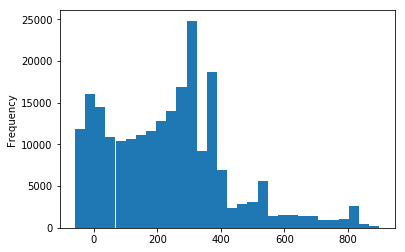

In [4]:
# 15 minutes
delay_cutoff = 15 * 60

# Bin width in seconds
bin_width = 30

positions[positions['delay'] < delay_cutoff]['delay'].plot.hist(bins = int(delay_cutoff/bin_width))
print('Size before filtering: ', len(positions))
print('Size after filtering: ', len(positions[positions['delay'] < delay_cutoff]))
print('Dropping top {}%'.format((len(positions) - len(positions[positions['delay'] < delay_cutoff])) / len(positions) * 100 ))

Parse positions

In [5]:
# Remove outliers (delay >= delay_cutoff)
positions = positions[positions['delay'] < delay_cutoff]

# Convert position times to time objects
positions['arrival_time'] = pd.to_datetime(positions['arrival_time'])
positions['departure_time'] = pd.to_datetime(positions['departure_time'])

# Add parsed hours to positions
positions = positions.assign(hours = positions['arrival_time'].dt.hour)

# Pre-sort positions
positions = positions.sort_values(['trip_id', 'date', 'stop_sequence'])

# Group positions by trip, one trip can only occur once in a given date
individual_trips = positions.groupby(['trip_id', 'date'])

# Identify gap sizes
positions['gaps'] = individual_trips.stop_sequence.transform(consecutive_diff) - 1

display(positions)

,trip_id,stop_sequence,date,day_of_week,route_id,stop_id,direction_id,arrival_time,departure_time,delay,hours,gaps
160194,112947314236269500,20,2021-09-18,saturday,1,8062,8262,2021-12-20 08:43:50,2021-12-20 08:46:25,648,8,NaN
68548,112947423236269500,8,2021-09-11,saturday,1,8071,8642,2021-12-20 21:06:19,2021-12-20 21:07:21,300,21,NaN
68549,112947423236269500,9,2021-09-11,saturday,1,8061,8642,2021-12-20 21:07:53,2021-12-20 21:08:23,317,21,0.0
68550,112947423236269500,10,2021-09-11,saturday,1,8051,8642,2021-12-20 21:08:55,2021-12-20 21:09:27,316,21,0.0
68551,112947423236269500,11,2021-09-11,saturday,1,8041,8642,2021-12-20 21:09:58,2021-12-20 21:11:03,323,21,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
237101,113613009238687005,21,2021-09-21,tuesday,6,8412,8472,2021-12-20 05:56:28,2021-12-20 06:04:23,481,5,0.0
237102,113613009238687005,22,2021-09-21,tuesday,6,8422,8472,2021-12-20 05:57:30,2021-12-20 06:05:26,490,5,0.0
237103,113613009238687005,23,2021-09-21,tuesday,6,8432,8472,2021-12-20 05:59:07,2021-12-20 06:06:59,461,5,0.0
237104,113613009238687005,24,2021-09-21,tuesday,6,8442,8472,2021-12-20 06:01:14,2021-12-20 06:08:01,411,6,0.0


Parse GTFS

In [6]:
# Append shape_dist_traveled column to stop_times
gtfs = gtfs.append_dist_to_stop_times()

/home/diogo/.local/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/home/diogo/.local/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [7]:
# Normalizes GTFS times to avoid errors while processing
def normalize_times(stop_time):
    if stop_time > '24':
        stop_time = str(int(stop_time[:2]) - 24).zfill(2) + stop_time[2:]
    return stop_time
  
gtfs.stop_times['arrival_time'] = gtfs.stop_times['arrival_time'].apply(normalize_times)
gtfs.stop_times['arrival_time'] = pd.to_datetime(gtfs.stop_times['arrival_time'])
gtfs.stop_times['departure_time'] = gtfs.stop_times['departure_time'].apply(normalize_times)
gtfs.stop_times['departure_time'] = pd.to_datetime(gtfs.stop_times['departure_time'])


In [8]:
# Calculate distance between consecutive stops
gtfs.stop_times['dist_delta'] = gtfs.stop_times.groupby('trip_id').shape_dist_traveled.transform(consecutive_diff)

In [9]:
# Parse ID's to remove letters and convert to integers
def parse_ids(id):
    return int(re.search(r'\d+', id).group())

gtfs.stop_times['parsed_stop_id'] = gtfs.stop_times['stop_id'].apply(parse_ids)
gtfs.stop_times['parsed_trip_id'] = gtfs.stop_times['trip_id'].apply(parse_ids)
gtfs.routes['parsed_route_id'] = gtfs.routes['route_id'].apply(parse_ids)
gtfs.stops['parsed_stop_id'] = gtfs.stops['stop_id'].apply(parse_ids)


display(gtfs.stop_times)
display(gtfs.routes)
display(gtfs.stops)

,trip_id,stop_id,arrival_time,departure_time,stop_sequence,pickup_type,drop_off_type,shape_dist_traveled,dist_delta,parsed_stop_id,parsed_trip_id
0,112360041233813600,0089,2021-12-20 05:32:00,2021-12-20 05:32:00,1,NaN,NaN,0.000421,NaN,89,112360041233813600
1,112360041233813600,5501,2021-12-20 05:33:02,2021-12-20 05:33:02,2,NaN,NaN,0.282847,0.282426,5501,112360041233813600
2,112360041233813600,5502,2021-12-20 05:34:00,2021-12-20 05:34:00,3,NaN,NaN,0.551631,0.268784,5502,112360041233813600
3,112360041233813600,5503,2021-12-20 05:35:41,2021-12-20 05:35:41,4,NaN,NaN,1.059321,0.507690,5503,112360041233813600
4,112360041233813600,5504,2021-12-20 05:37:11,2021-12-20 05:37:11,5,NaN,NaN,1.509733,0.450413,5504,112360041233813600
...,...,...,...,...,...,...,...,...,...,...,...
4365128,a-113494936238264040,6450,2021-12-20 06:47:00,2021-12-20 06:47:00,3,NaN,NaN,0.793702,0.448123,6450,113494936238264040
4365129,a-113494936238264040,1462,2021-12-20 06:48:06,2021-12-20 06:48:06,4,NaN,NaN,1.056590,0.262888,1462,113494936238264040
4365130,a-113494936238264040,6055,2021-12-20 06:49:46,2021-12-20 06:49:46,5,NaN,NaN,1.456465,0.399875,6055,113494936238264040
4365131,a-113494936238264040,6056,2021-12-20 06:51:09,2021-12-20 06:51:09,6,NaN,NaN,1.788387,0.331922,6056,113494936238264040


,agency_id,route_id,route_short_name,route_long_name,route_type,route_color,route_text_color,parsed_route_id
0,STIB-MIVB,1,5,ERASME - HERRMANN-DEBROUX,1,E6B012,FFFFFF,1
1,STIB-MIVB,10,4,GARE DU NORD - STALLE (P),0,F25482,000000,10
2,STIB-MIVB,11,8,LOUISE - ROODEBEEK,0,0098D4,FFFFFF,11
3,STIB-MIVB,12,9,SIMONIS - ARBRE BALLON,0,CD5599,FFFFFF,12
4,STIB-MIVB,13,19,GROOT-BIJGAARDEN - DE WAND,0,DE3B21,FFFFFF,13
...,...,...,...,...,...,...,...,...
97,STIB-MIVB,98,NAV,PARKING C - HEYSEL,3,NaN,000000,98
98,STIB-MIVB,a-87,T51,STADE - VAN HAELEN,3,F3C300,000000,87
99,STIB-MIVB,a-88,T81,MARIUS RENARD - MONTGOMERY,3,4C8B33,FFFFFF,88
100,STIB-MIVB,a-89,T82,GARE DE BERCHEM - DROGENBOS,3,91BEE7,000000,89


,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,parsed_stop_id
0,0010106,4 - Boulevard Anspach,50.850262,4.351740,2.0,6,10106
1,0010115,4 - Boulevard Anspach,50.850262,4.351740,2.0,15,10115
2,0010206,2 - Place De Brouckère,50.851997,4.353216,2.0,6,10206
3,0010215,2 - Place De Brouckère,50.851997,4.353216,2.0,15,10215
4,0010306,3 - Place De Brouckère,50.851161,4.352890,2.0,6,10306
...,...,...,...,...,...,...,...
3252,9972F,DIEWEG,50.796526,4.348173,NaN,NaN,9972
3253,9979B,BARA,50.838552,4.336295,NaN,NaN,9979
3254,9983,MEUDON,50.844760,4.417568,NaN,NaN,9983
3255,9986F,CHURCHILL,50.812075,4.353740,NaN,NaN,9986


##### Fill missing values and calculate speeds

Fill missing values

In [10]:
positions_filled = positions.copy()

# For each position with gaps
count = 0
total = len(positions_filled[positions_filled['gaps'] > 0])
for index, position in positions_filled[positions_filled['gaps'] > 0].iterrows():
    # Show progress
    if count % 100 == 0:
        print('Progress: {}/{} ({:.2f}%)'.format(count, total, count / total * 100))
    count += 1

    new_stop = position.copy()
    stop_times = gtfs.stop_times[gtfs.stop_times['parsed_trip_id'] == position.trip_id]
    for i in range(position.stop_sequence - int(position.gaps) + 1, position.stop_sequence):
        if not np.any(stop_times.stop_sequence == i):
            break

        # Get GTFS scheduled stop time
        stop_time = stop_times[stop_times['stop_sequence'] == i].iloc[0]

        # Setup new stop
        new_stop['stop_id'] = stop_time['parsed_stop_id']
        new_stop['stop_sequence'] = stop_time['stop_sequence']

        # Assume transport got there with same delay as at next available stop (position)
        new_stop['delay'] = position['delay']
        new_stop['arrival_time'] = stop_time['arrival_time'] + pd.to_timedelta(position['delay'], unit='s')
        new_stop['departure_time'] = stop_time['departure_time'] + pd.to_timedelta(position['delay'], unit='s')
        
        positions_filled = positions_filled.append(new_stop, ignore_index=True)

positions_filled = positions_filled.sort_values(['trip_id', 'date', 'stop_sequence'])
display(positions_filled)

Progress: 0/27250 (0.00%)
Progress: 100/27250 (0.37%)
Progress: 200/27250 (0.73%)
Progress: 300/27250 (1.10%)
Progress: 400/27250 (1.47%)
Progress: 500/27250 (1.83%)
Progress: 600/27250 (2.20%)
Progress: 700/27250 (2.57%)
Progress: 800/27250 (2.94%)
Progress: 900/27250 (3.30%)
Progress: 1000/27250 (3.67%)
Progress: 1100/27250 (4.04%)
Progress: 1200/27250 (4.40%)
Progress: 1300/27250 (4.77%)
Progress: 1400/27250 (5.14%)
Progress: 1500/27250 (5.50%)
Progress: 1600/27250 (5.87%)
Progress: 1700/27250 (6.24%)
Progress: 1800/27250 (6.61%)
Progress: 1900/27250 (6.97%)
Progress: 2000/27250 (7.34%)
Progress: 2100/27250 (7.71%)
Progress: 2200/27250 (8.07%)
Progress: 2300/27250 (8.44%)
Progress: 2400/27250 (8.81%)
Progress: 2500/27250 (9.17%)
Progress: 2600/27250 (9.54%)
Progress: 2700/27250 (9.91%)
Progress: 2800/27250 (10.28%)
Progress: 2900/27250 (10.64%)
Progress: 3000/27250 (11.01%)
Progress: 3100/27250 (11.38%)
Progress: 3200/27250 (11.74%)
Progress: 3300/27250 (12.11%)
Progress: 3400/27250

,trip_id,stop_sequence,date,day_of_week,route_id,stop_id,direction_id,arrival_time,departure_time,delay,hours,gaps
0,112947314236269500,20,2021-09-18,saturday,1,8062,8262,2021-12-20 08:43:50,2021-12-20 08:46:25,648,8,NaN
1,112947423236269500,8,2021-09-11,saturday,1,8071,8642,2021-12-20 21:06:19,2021-12-20 21:07:21,300,21,NaN
2,112947423236269500,9,2021-09-11,saturday,1,8061,8642,2021-12-20 21:07:53,2021-12-20 21:08:23,317,21,0.0
3,112947423236269500,10,2021-09-11,saturday,1,8051,8642,2021-12-20 21:08:55,2021-12-20 21:09:27,316,21,0.0
4,112947423236269500,11,2021-09-11,saturday,1,8041,8642,2021-12-20 21:09:58,2021-12-20 21:11:03,323,21,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
227569,113613009238687005,21,2021-09-21,tuesday,6,8412,8472,2021-12-20 05:56:28,2021-12-20 06:04:23,481,5,0.0
227570,113613009238687005,22,2021-09-21,tuesday,6,8422,8472,2021-12-20 05:57:30,2021-12-20 06:05:26,490,5,0.0
227571,113613009238687005,23,2021-09-21,tuesday,6,8432,8472,2021-12-20 05:59:07,2021-12-20 06:06:59,461,5,0.0
227572,113613009238687005,24,2021-09-21,tuesday,6,8442,8472,2021-12-20 06:01:14,2021-12-20 06:08:01,411,6,0.0


Calculate speeds

In [13]:
positions_filled.merge(gtfs.stop_times, left_on=['trip_id', 'stop_id'], right_on=['parsed_trip_id', 'parsed_stop_id'], suffixes=['_pos', '_stop'])

,trip_id_pos,stop_sequence_pos,date,day_of_week,route_id,stop_id_pos,direction_id,arrival_time_pos,departure_time_pos,delay,...,stop_id_stop,arrival_time_stop,departure_time_stop,stop_sequence_stop,pickup_type,drop_off_type,shape_dist_traveled,dist_delta,parsed_stop_id,parsed_trip_id
0,112947314236269500,20,2021-09-18,saturday,1,8062,8262,2021-12-20 08:43:50,2021-12-20 08:46:25,648,...,8062,2021-12-20 08:54:38,2021-12-20 08:54:38,20,NaN,NaN,13.068499,0.314884,8062,112947314236269500
1,112947423236269500,8,2021-09-11,saturday,1,8071,8642,2021-12-20 21:06:19,2021-12-20 21:07:21,300,...,8071,2021-12-20 21:11:19,2021-12-20 21:11:19,8,NaN,NaN,4.605817,0.751396,8071,112947423236269500
2,112947423236269500,8,2021-09-18,saturday,1,8071,8642,2021-12-20 21:08:28,2021-12-20 21:10:03,171,...,8071,2021-12-20 21:11:19,2021-12-20 21:11:19,8,NaN,NaN,4.605817,0.751396,8071,112947423236269500
3,112947423236269500,9,2021-09-11,saturday,1,8061,8642,2021-12-20 21:07:53,2021-12-20 21:08:23,317,...,8061,2021-12-20 21:13:10,2021-12-20 21:13:10,9,NaN,NaN,5.844227,1.238410,8061,112947423236269500
4,112947423236269500,9,2021-09-18,saturday,1,8061,8642,2021-12-20 21:10:34,2021-12-20 21:11:06,156,...,8061,2021-12-20 21:13:10,2021-12-20 21:13:10,9,NaN,NaN,5.844227,1.238410,8061,112947423236269500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279301,113613009238687005,23,2021-09-21,tuesday,6,8432,8472,2021-12-20 05:59:07,2021-12-20 06:06:59,461,...,8432,2021-12-20 06:06:48,2021-12-20 06:06:48,23,NaN,NaN,13.392715,0.519719,8432,113613009238687005
279302,113613009238687005,1,2021-09-21,tuesday,6,8834,8472,2021-12-20 05:25:30,2021-12-20 05:37:43,835,...,8834,2021-12-20 05:39:25,2021-12-20 05:39:25,1,NaN,NaN,0.000000,NaN,8834,113613009238687005
279303,113613009238687005,15,2021-09-21,tuesday,6,8342,8472,2021-12-20 05:54:21,2021-12-20 05:54:54,201,...,8342,2021-12-20 05:57:42,2021-12-20 05:57:42,15,NaN,NaN,9.317780,0.455484,8342,113613009238687005
279304,113613009238687005,24,2021-09-21,tuesday,6,8442,8472,2021-12-20 06:01:14,2021-12-20 06:08:01,411,...,8442,2021-12-20 06:08:05,2021-12-20 06:08:05,24,NaN,NaN,13.931179,0.538464,8442,113613009238687005


In [14]:
# Get dist_delta from GTFS
positions_filled['dist_delta'] = positions_filled.merge(gtfs.stop_times, left_on=['trip_id', 'stop_id'], right_on=['parsed_trip_id', 'parsed_stop_id'], suffixes=['_pos', ''])['dist_delta']

# Calculate t_delta
def calc_t_delta(df):
    return df['arrival_time'] - df.shift(1)['departure_time']

positions_filled['t_delta'] = positions_filled.groupby(['trip_id', 'date']).apply(calc_t_delta).droplevel(level = [0, 1])

# Calculate speed
positions_filled['speed'] = positions_filled['dist_delta'] / (positions_filled['t_delta'] / np.timedelta64(1, 'h'))

In [15]:
# Calculate average speed over each network segment and time
agg_speeds = positions_filled.groupby(by=['route_id', 'direction_id', 'stop_id', 'hours'])['speed'].mean()
agg_speeds

route_id  direction_id  stop_id  hours
1         8161          8012     6        56.636290
                                 7        64.984921
                                 8        55.077848
                                 9        48.189410
                                 10       26.181119
                                            ...    
95        4318          6433     19        5.358128
                                 20        7.425898
                                 21        3.546643
                                 22        3.120162
          6432          4351     22             NaN
Name: speed, Length: 8789, dtype: float64

##### Visualize results

In [16]:
# Speed cutoff in km/h
speed_cutoff = 120

# Calculate average speed over each network segment and time
speed_positive = positions_filled['speed'] > 0
speed_finite = positions_filled['speed'] < speed_cutoff
agg_speeds = positions_filled[speed_positive & speed_finite].groupby(by=['route_id', 'direction_id', 'stop_id', 'day_of_week', 'hours'])['speed'].mean()
display(agg_speeds)

route_id  direction_id  stop_id  day_of_week  hours
1         8161          8012     monday       6        43.130229
                                              7        57.687551
                                              8        67.239744
                                              9        50.389403
                                              10       82.854825
                                                         ...    
95        4318          6433     tuesday      12        6.052484
                                              13       17.362361
                                              14       10.626811
                                              15        4.077497
                                              16        5.592792
Name: speed, Length: 27971, dtype: float64

Show average speeds by route

In [17]:
# Present this in a suitable visual way

def calc_red(route):
    return int( 255 * min(1, 2 * (1 - route.speed_by_route_normalized)) )


def calc_green(route):
    return int( 255 * min(1, 2 * route.speed_by_route_normalized) )


def calc_blue(route):
    return 0


speeds_by_route = agg_speeds.groupby(by='route_id').mean()
min_speed_by_route = speeds_by_route.min()
max_speed_by_route = speeds_by_route.max()
speeds_by_route_df = pd.DataFrame({
    'route_id': speeds_by_route.index.to_list(),
    'speed_by_route': speeds_by_route.iloc[:],
    'speed_by_route_normalized': (speeds_by_route.iloc[:] - min_speed_by_route) / (max_speed_by_route - min_speed_by_route) if max_speed_by_route != min_speed_by_route else 1
})
speeds_by_route_df.reset_index(drop = True, inplace = True)
display(speeds_by_route_df)
routes = gtfs.routes
routes = routes.merge(speeds_by_route_df, left_on='parsed_route_id', right_on='route_id', suffixes=['', '_from_positions'])
# Asign color
routes['color'] = routes.apply(lambda route: '#%02x%02x%02x' % (calc_red(route), calc_green(route), calc_blue(route)), axis=1)

# Routes visualization
gtfs.routes = gtfs.routes.merge(speeds_by_route, left_on='parsed_route_id', right_on='route_id')
gtfs.map_routes(routes['route_id'], routes['color'])


,route_id,speed_by_route,speed_by_route_normalized
0,1,48.696702,0.863758
1,2,53.323070,1.000000
2,5,49.249882,0.880049
3,6,52.575634,0.977989
4,7,21.082955,0.050564
5,51,20.396221,0.030340
6,81,19.795191,0.012641
7,95,19.365956,0.000000


/home/diogo/.local/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/home/diogo/.local/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
/home/diogo/.local/lib/python3.7/site-packages/pandas/core/common.py:471: FutureWarning: CRS mismatch between CRS of the passed geometries and 'crs'. Use 'GeoDataFrame.set_crs(crs, allow_override=True)' to overwrite CRS or 'GeoDataFrame.to_crs(crs)' to reproject geometries. CRS mismatch will raise an error in the future versions of GeoPandas.
  return func(obj, *args, **kwargs)
/home/diogo/.local/l

In [18]:
# Present this in a suitable visual way (Stops)

def calc_red(stop):
    return int( 255 * min(1, 2 * (1 - stop.speed_normalized)) )


def calc_green(stop):
    return int( 255 * min(1, 2 * stop.speed_normalized) )


def calc_blue(stop):
    return 0


speeds_by_stop = agg_speeds.groupby(by='stop_id').mean()
min_speed_by_stop = speeds_by_stop.min()
max_speed_by_stop = speeds_by_stop.max()
speeds_by_stop_df = pd.DataFrame({
    'stop_id': speeds_by_stop.index.to_list(),
    'speed': speeds_by_stop.iloc[:],
    'speed_normalized': (speeds_by_stop.iloc[:] - min_speed_by_stop) / (max_speed_by_stop - min_speed_by_stop)
})
speeds_by_stop_df.reset_index(drop = True, inplace = True)
display(speeds_by_stop_df)

stops = gtfs.stops.merge(speeds_by_stop_df, left_on='parsed_stop_id', right_on='stop_id', suffixes=['', '_pos'])

# Asign color
stops['color_by_stop'] = stops.apply(lambda stop: '#%02x%02x%02x' % (calc_red(stop), calc_green(stop), calc_blue(stop)), axis=1)

# Initialize map
my_map = fl.Map(tiles="cartodbpositron")

# Create a feature group for the stops and add it to the map
group = fl.FeatureGroup(name="Stops")

# Add stops to feature group
for index, stop in stops.iterrows():
    fl.CircleMarker(
        location=[stop.stop_lat, stop.stop_lon],
        popup='<b>Stop name</b>: ' + stop.stop_name + '<br>' +
        '<b>Stop ID</b>: ' + stop.stop_id + '<br>' +
        '<b>Stop speed</b>: ' + "%.2f km/h" % stop.speed,
        color=stop.color_by_stop,
        fill=True,
        fill_opacity=0.5,
        stroke=False,
    ).add_to(my_map)

bounds = [
    (stops.stop_lat.min(), stops.stop_lon.min()),
    (stops.stop_lat.max(), stops.stop_lon.max()),
]
my_map.fit_bounds(bounds, padding=[1, 1])
my_map

,stop_id,speed,speed_normalized
0,636,14.532550,0.130174
1,702,13.305824,0.116601
2,703,18.779712,0.177168
3,704,25.467776,0.251168
4,705,18.862737,0.178086
...,...,...,...
354,8824,57.530215,0.605927
355,8834,51.473168,0.538908
356,9051,10.291470,0.083248
357,9963,26.609388,0.263800


## Task 2 (vehicle delays at different stops)

**Question 2: Vehicle delay variation over network stops and time**

Analyze the vehicle delays at the different stops, how it varies across stops and over time. Present this in a suitable visual way.

In order to visualize the vehicle delays, the data used is the same produced for the other tasks, which connects the real-time data from JSON files to the schedule from GTFS files to compute the delay. In this case, the delays greater than one hour are removed from the dataset because they are not reliable.
The aim is to plot the vehicle stops in Brussels' map using different colours to represent how considerable is the maximum delay (from red to green). Different aggregations can be performed on the data: it was grouped by the delay by the day of the week (Monday, Tuesday, Wednesday, ...) and by the hour of the day in order to see how the overall situation changes according to the rush hour or business working days.

First of all, the coordinates of the stops are retrieved from the GTFS files. After that, the data is grouped by day of week or hour and stop id taking the maximum delay as aggregation (because the average delay was generally uniform between the different days or hours of the day). The obtained aggregation is positived in order not to consider negative delays better than arriving on time. Finally, a color is associated to each stop discretizing the delay.

The following maps can show the situation by hour of the day or day of the week.

In [21]:
import pandas as pd
import gtfs_kit as gk
import geopandas as gpd
import folium as fl
import folium.plugins as fp
# interact (slider widget)
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import warnings
warnings.filterwarnings("ignore")

DATA_DIR = DATA_FOLDER = "../data/"
CSV_FILE = DATA_DIR + "preprocessed/SeveralLines.csv"
GTFS_FILE = DATA_DIR + "parsed/gtfs.zip"

In [22]:
lines = pd.read_csv(CSV_FILE)
lines["hour"] = lines.departure_time.str[:2].astype(int)

# remove too-big delays (more than 1h)
line3 = lines[lines.delay < 3600]
line3

,trip_id,stop_sequence,date,day_of_week,route_id,stop_id,direction_id,arrival_time,departure_time,delay,hour
0,112949621236270000,8,2021-09-06,monday,1,8071,8642,21:05:48.0000000,21:07:22.0000000,331,21
1,112949621236270000,9,2021-09-06,monday,1,8061,8642,21:07:53.0000000,21:09:28.0000000,317,21
2,112949621236270000,11,2021-09-06,monday,1,8041,8642,21:10:31.0000000,21:11:01.0000000,290,21
3,112949621236270000,12,2021-09-06,monday,1,8031,8642,21:11:34.0000000,21:12:04.0000000,304,21
4,112949621236270000,13,2021-09-06,monday,1,8021,8642,21:12:35.0000000,21:12:35.0000000,295,21
...,...,...,...,...,...,...,...,...,...,...,...
237101,113613009238687005,21,2021-09-21,tuesday,6,8412,8472,05:56:28.0000000,06:04:23.0000000,481,6
237102,113613009238687005,22,2021-09-21,tuesday,6,8422,8472,05:57:30.0000000,06:05:26.0000000,490,6
237103,113613009238687005,23,2021-09-21,tuesday,6,8432,8472,05:59:07.0000000,06:06:59.0000000,461,6
237104,113613009238687005,24,2021-09-21,tuesday,6,8442,8472,06:01:14.0000000,06:08:01.0000000,411,6


In [23]:
# generate color scale
def green_to_red():
    red = 0
    green = 255
    stepSize = 50 #TODO change to have more or less values in the resulting list
    colors = [rgb_to_hex(red, green, 0)]
    while red < 255:
        red += stepSize
        if red > 255:
            red = 255
        colors.append( rgb_to_hex(red, green, 0) )
    while green > 0:
        green -= stepSize
        if green < 0:
            green = 0
        colors.append( rgb_to_hex(red, green, 0) )
    return colors

def rgb_to_hex(r, g, b):
    return '#%02x%02x%02x' % (r, g, b)

COLORS = green_to_red()

In [24]:
# retrieve coordinates of stops
gtfs = gk.read_feed(GTFS_FILE, dist_units='m')
# convert stop_ids to int
gtfs.stops.stop_id = gtfs.stops.stop_id.str.replace('[A-Z]','', regex=True).astype(int)
# get coordinates of stops in line3 from gtfs
stopid_to_point = gk.build_geometry_by_stop(gtfs, stop_ids=list(line3.stop_id.unique()))
gdf = gpd.GeoDataFrame({"stop_id": stopid_to_point.keys(), "geometry": stopid_to_point.values()})
gdf.head(5)

,stop_id,geometry
0,631,POINT (4.33795 50.83650)
1,636,POINT (4.33741 50.83681)
2,702,POINT (4.33826 50.83635)
3,703,POINT (4.34297 50.83255)
4,704,POINT (4.34654 50.82972)


In [25]:
def group_by_and_discretize(df, by):
    # group by date and stop for getting one single color for each stop per date
    new_df = df.groupby([by, df.stop_id], as_index=False).agg(
        delay=pd.NamedAgg(column="delay", aggfunc="max")
    )
    
    # positivize delays
    new_df.loc[new_df.delay < 0, 'delay'] = 0

    # assign a color to each row discretizing the delay
    new_df["color"] = pd.cut(new_df.delay, len(COLORS), labels=COLORS)
    new_df.sort_values("delay")

    # add coordinates to the dataset
    new_df = new_df.merge(gdf)

    return new_df

grouped_by_weekday = group_by_and_discretize(lines, lines.day_of_week)
#grouped_by_date = group_by_and_discretize(lines, lines.date)
grouped_by_hour = group_by_and_discretize(lines, lines.hour)

In [26]:
def plot_map(filtered_df):
    map = fl.Map(
        [50.85, 4.35],
        zoom_start=12, control_scale=True)

    for tuple in filtered_df.itertuples():
        fl.CircleMarker(
            [tuple.geometry.y, tuple.geometry.x],
            popup=tuple.stop_id,
            radius=2,
            color=tuple.color
        ).add_to(map)

    return map

In [27]:
# interact with hour
def plot_by_hour(hour):
    return plot_map(grouped_by_hour[grouped_by_hour.hour==hour])

wid = widgets.IntSlider(min=grouped_by_hour.hour.min(), max=grouped_by_hour.hour.max(), step=1, value=10);
interact(plot_by_hour, hour=wid);

interactive(children=(IntSlider(value=10, description='hour', max=23), Output()), _dom_classes=('widget-intera…

In [28]:
# interact with day of the week
def plot_by_weekday(weekday):
    return plot_map(grouped_by_weekday[grouped_by_weekday.day_of_week==weekday])

wid = widgets.SelectionSlider(
    options=["monday", "tuesday", "wednesday", "thursday", "friday", "saturday", "sunday"],
    value="monday",
    description='Select weekday',
    disabled=False,
    continuous_update=True,
    orientation='horizontal',
    readout=True
)
interact(plot_by_weekday, weekday=wid)

interactive(children=(SelectionSlider(description='Select weekday', options=('monday', 'tuesday', 'wednesday',…

<function __main__.plot_by_weekday(weekday)>

## Task 3 (arrival time forecasting)

Our approach to task 3 was to build a regression model for the duration of the trip in seconds. This result is later translated into a timestamp value. This task was split into the following subsections: data preparation, data exploration, modeling, and finat result.

We first prepare the data with columns that were thought to be useful, then analyse the data to check which data should be dropped, which columns are correlated and which columns might be important. In the modeling part, we start with a baseline Linear Regression model and a Decision Tree based one, choose the best between the two and proceed to optimize its hyperparameters.

We assume that we should build one model per line, so the model described below applies for line 3. It could be extended in the same way for other lines as well.

### Reading and preparing data

Our **goal** in this section is to have a dataset with the following columns to work with:
- start_time : the time that the bus arrived at the first stop of its route
- arrival_time : the time that the bus arrived at the current stop
- stop_id : id of the current stop
- route_id : id of the current line/route
- direction_id : id of the last stop in the route
- type_of_transportation : whether it's a bus, tram or metro (ruled out since we are only looking at one line at the moment)
- day_of_week : day_of_week of the start_time
- first_stop : the first stop of the line/route
- previous_stop : the previous stop in the route
- stop_sequence : the current stop number in the sequence

We are going to start by reading the dataset for one line using the pandas library.

In [29]:
import pandas as pd

In [30]:
df_raw = pd.read_csv('../data/preprocessed/Line3.csv')

This is what the preprocessed data looks like:

In [31]:
df_raw.head()

,trip_id,stop_sequence,date,day_of_week,route_id,stop_id,direction_id,arrival_time,departure_time,delay
0,113374225237645001,1,2021-09-06,monday,3,9986,5776,03:57:59.0000000,03:59:36.0000000,7621
1,113374228237645001,1,2021-09-06,monday,3,6424,5776,16:10:07.0000000,16:13:17.0000000,233
2,113374228237645001,2,2021-09-06,monday,3,6209,5776,16:11:42.0000000,16:11:42.0000000,240
3,113374228237645001,3,2021-09-06,monday,3,722,5776,16:14:21.0000000,16:14:21.0000000,219
4,113374228237645001,4,2021-09-06,monday,3,723,5776,16:15:24.0000000,16:18:37.0000000,237


And these are the data types of each column and the amoun of non-null values:

In [32]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40908 entries, 0 to 40907
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   trip_id         40908 non-null  int64 
 1   stop_sequence   40908 non-null  int64 
 2   date            40908 non-null  object
 3   day_of_week     40908 non-null  object
 4   route_id        40908 non-null  int64 
 5   stop_id         40908 non-null  int64 
 6   direction_id    40908 non-null  int64 
 7   arrival_time    40908 non-null  object
 8   departure_time  40908 non-null  object
 9   delay           40908 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 3.1+ MB


We then explore the data and find some useful information:
- There is only one route_id per trip_id
- There is only one direction_id per trip_id
- We have only one trip per day that goes through all the stop_sequence numbers

In [33]:
print(f"route_ids per trip_id: {df_raw.groupby(['trip_id'])['route_id'].nunique().max()}")
print(f"direction_ids per trip_id: {df_raw.groupby(['trip_id'])['direction_id'].nunique().max()}")
print(f"route_ids per trip_id: {df_raw.groupby(['trip_id','date','stop_id'])['arrival_time'].nunique().max()}")

route_ids per trip_id: 1
direction_ids per trip_id: 1
route_ids per trip_id: 1


Now we calculate the first stop of the trip, the previous stop of the trip and the arrival time of the first stop (which will be our vehicle start time)

In [34]:
# Obtain first stop and arrival time in first stop
df_aux = df_raw.iloc[sorted(df_raw.groupby(['trip_id','date'])['stop_sequence'].idxmin())][['trip_id', 'date', 'stop_id', 'arrival_time']]
df_aux = df_aux.rename(columns={'arrival_time':'start_time', 'stop_id':'first_stop'})

df = df_raw.merge(df_aux, on=['trip_id', 'date'])

del df_aux

# Obtain previous stop
df['previous_stop'] = df.groupby(['trip_id','date'])['stop_id'].shift(1).fillna(-1).astype(int)

Now we obtain different granularities of the time columns

In [35]:
# Convert times to datetime type
df['start_time'] = pd.to_datetime(df['start_time'], format='%H:%M:%S.%f')
df['arrival_time'] = pd.to_datetime(df['arrival_time'], format='%H:%M:%S.%f')

df['start_time_hour'] = df['start_time'].dt.hour
df['start_time_minute'] = df['start_time'].dt.minute

df['start_time_in_minutes'] = df['start_time_hour'] * 60 + df['start_time_minute']

df['trip_duration_so_far_in_seconds'] = (df['arrival_time'] - df['start_time']).dt.seconds

Here we drop data that either won't be used or is considered incorrect. For example, trips where the vehicle start time is greater than the arrival time at a given stop and vehicles with delays larger than 1 hour. We assume here that the user will never ask for the arrival time of the first stop, since it would be the same and the vehicle start time that is given as input.

In [36]:
# Exclude rows for the first stop, since we don't need to forecast the arrival time for it
df = df[df.stop_sequence != 1]

# Exclude rows where the start time is greater than the arrival time 
# (which indicates the trip actually didn't begin in the same day
df = df[df.start_time < df.arrival_time]

# Exclude rows with delay grater than 1 hour, they must be errors in the dataset
df = df[df.delay < 60*60]

In [37]:
df = df[['trip_id', 'date', 'day_of_week', 'route_id', 'direction_id', 'stop_id', 'stop_sequence', 'first_stop', 'previous_stop', 'start_time', 'start_time_hour', 'start_time_minute', 'arrival_time', 'trip_duration_so_far_in_seconds', 'start_time_in_minutes']]

Here we encode the day of the week into numbers and create a flag to indicate if the day is a weekend or not. We later evaluate if these features are useful in the modeling part.

In [38]:
# day_of_week label encoding
df['day_of_week_number'] = 0
df.loc[df['day_of_week'] == 'monday', 'day_of_week_number'] = 1
df.loc[df['day_of_week'] == 'tuesday', 'day_of_week_number'] = 2
df.loc[df['day_of_week'] == 'wednesday', 'day_of_week_number'] = 3
df.loc[df['day_of_week'] == 'thursday', 'day_of_week_number'] = 4
df.loc[df['day_of_week'] == 'friday', 'day_of_week_number'] = 5
df.loc[df['day_of_week'] == 'saturday', 'day_of_week_number'] = 6
df.loc[df['day_of_week'] == 'sunday', 'day_of_week_number'] = 7

df['weekend'] = 0
df.loc[df['day_of_week'] == 'saturday', 'weekend'] = 1
df.loc[df['day_of_week'] == 'sunday', 'weekend'] = 1

Here is the final result of the data preparation phase:

In [39]:
df.head()

,trip_id,date,day_of_week,route_id,direction_id,stop_id,stop_sequence,first_stop,previous_stop,start_time,start_time_hour,start_time_minute,arrival_time,trip_duration_so_far_in_seconds,start_time_in_minutes,day_of_week_number,weekend
2,113374228237645001,2021-09-06,monday,3,5776,6209,2,6424,6424,1900-01-01 16:10:07,16,10,1900-01-01 16:11:42,95,970,1,0
3,113374228237645001,2021-09-06,monday,3,5776,722,3,6424,6209,1900-01-01 16:10:07,16,10,1900-01-01 16:14:21,254,970,1,0
4,113374228237645001,2021-09-06,monday,3,5776,723,4,6424,722,1900-01-01 16:10:07,16,10,1900-01-01 16:15:24,317,970,1,0
5,113374228237645001,2021-09-06,monday,3,5776,724,5,6424,723,1900-01-01 16:10:07,16,10,1900-01-01 16:19:41,574,970,1,0
6,113374228237645001,2021-09-06,monday,3,5776,725,6,6424,724,1900-01-01 16:10:07,16,10,1900-01-01 16:19:10,543,970,1,0


### Exploring data

In this section we use two libraries to get some insights from the data. The first one is [Pandas Profiling](https://pypi.org/project/pandas-profiling/), which generates a profile report for a pandas dataframe. It gathers information on unique values, missing values, quantile statistics, descriptive statistics, and correlations between columns. The second one is from the [statsmodels](https://www.statsmodels.org/stable/index.html) library that provides statistical models, statistical data exploration, and conducts statistical tests.

In [44]:
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from pandas_profiling import ProfileReport

[autoreload of numpy.lib failed: Traceback (most recent call last):
  File "/home/diogo/.local/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/diogo/.local/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/usr/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/usr/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 728, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/home/diogo/.local/lib/python3.7/site-packages/numpy/lib/__init__.py", line 44, in <module>
    __all__ += type_check.__all__
NameError: name 'type_check' is not defined
]
[autoreload of numpy.matrixlib failed: Traceb

ImportError: cannot import name 'doccer' from 'scipy._lib' (/usr/lib/python3/dist-packages/scipy/_lib/__init__.py)

#### Pandas Profiling

In [ ]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Highlighted conclusions from the pandas profiling results**
- route_id has a constant value, so we should drop it
- stop_id is highly correlated with previous_stop, so we should consider dropping it and see if the results improve

#### Statsmodels

In order to use statsmodels, we first fit an Ordinary Least Squares (OLS) function to see what would be the R-squared result of the selected columns. We can also see the P-value of the statistical test that tests the hypothesis that a certain feature is important for the model. It can provide us insights into which columns could be dropped to test for better model results later.

In [ ]:
columns_chosen = ['day_of_week_number', 'weekend', 'direction_id', 'stop_id', 'stop_sequence',
       'first_stop', 'start_time_in_minutes']

target = 'trip_duration_so_far_in_seconds'

In [ ]:
results = sm.OLS(df[target], df[columns_chosen]).fit()

In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       OLS Regression Results                                       
====================================================================================================
Dep. Variable:     trip_duration_so_far_in_seconds   R-squared (uncentered):                   0.856
Model:                                         OLS   Adj. R-squared (uncentered):              0.856
Method:                              Least Squares   F-statistic:                          3.025e+04
Date:                             Mon, 20 Dec 2021   Prob (F-statistic):                        0.00
Time:                                     00:27:11   Log-Likelihood:                     -2.8047e+05
No. Observations:                            35742   AIC:                                  5.610e+05
Df Residuals:                                35735   BIC:                                  5.610e+05
Df Model:                                        7                                                  
Covariance Type:                         nonrobust                                                  
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
day_of_week_number       -1.0751      2.215     -0.485      0.627      -5.417       3.267
weekend                 -43.6179     13.386     -3.258      0.001     -69.855     -17.381
direction_id             -0.0107      0.002     -5.691      0.000      -0.014      -0.007
stop_id                  -0.0107      0.001     -8.179      0.000      -0.013      -0.008
stop_sequence            98.6935      0.493    200.152      0.000      97.727      99.660
first_stop                0.0911      0.001     62.997      0.000       0.088       0.094
start_time_in_minutes    -0.4639      0.011    -43.486      0.000      -0.485      -0.443
==============================================================================
Omnibus:                    44412.182   Durbin-Watson:                   0.304
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          7080569.022
Skew:                           6.832   Prob(JB):                         0.00
Kurtosis:                      70.585   Cond. No.                     3.76e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.76e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Now we do a similar thing but just fitting the model using the days of the week to see if there are days with more significance than others.

In [ ]:
results = smf.ols('trip_duration_so_far_in_seconds ~ C(day_of_week_number)', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                  
===========================================================================================
Dep. Variable:     trip_duration_so_far_in_seconds   R-squared:                       0.001
Model:                                         OLS   Adj. R-squared:                  0.001
Method:                              Least Squares   F-statistic:                     8.059
Date:                             Mon, 20 Dec 2021   Prob (F-statistic):           1.02e-08
Time:                                     00:27:11   Log-Likelihood:            -2.9504e+05
No. Observations:                            35742   AIC:                         5.901e+05
Df Residuals:                                35735   BIC:                         5.902e+05
Df Model:                                        6                                         
Covariance Type:                         nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                   1366.4783     10.415    131.204      0.000    1346.065    1386.892
C(day_of_week_number)[T.2]     2.2468     14.885      0.151      0.880     -26.928      31.421
C(day_of_week_number)[T.3]   -28.9882     16.522     -1.755      0.079     -61.372       3.395
C(day_of_week_number)[T.4]   -48.9279     16.322     -2.998      0.003     -80.920     -16.936
C(day_of_week_number)[T.5]   -46.5420     16.517     -2.818      0.005     -78.916     -14.168
C(day_of_week_number)[T.6]  -126.5565     23.061     -5.488      0.000    -171.756     -81.357
C(day_of_week_number)[T.7]   -75.7075     23.119     -3.275      0.001    -121.022     -30.393
==============================================================================
Omnibus:                    24323.564   Durbin-Watson:                   0.549
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           662636.123
Skew:                           2.902   Prob(JB):                         0.00
Kurtosis:                      23.280   Cond. No.                         6.80
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Now we check which granularity of the vehicle start time provides the best results.

In [ ]:
results = smf.ols('trip_duration_so_far_in_seconds ~ start_time_in_minutes', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                  
===========================================================================================
Dep. Variable:     trip_duration_so_far_in_seconds   R-squared:                       0.011
Model:                                         OLS   Adj. R-squared:                  0.010
Method:                              Least Squares   F-statistic:                     379.8
Date:                             Mon, 20 Dec 2021   Prob (F-statistic):           3.86e-84
Time:                                     00:27:11   Log-Likelihood:            -2.9488e+05
No. Observations:                            35742   AIC:                         5.898e+05
Df Residuals:                                35740   BIC:                         5.898e+05
Df Model:                                        1                                         
Covariance Type:                         nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept              1604.2857     14.576    110.063      0.000    1575.716    1632.855
start_time_in_minutes    -0.3432      0.018    -19.487      0.000      -0.378      -0.309
==============================================================================
Omnibus:                    23025.856   Durbin-Watson:                   0.552
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           554636.255
Skew:                           2.718   Prob(JB):                         0.00
Kurtosis:                      21.517   Cond. No.                     2.46e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.46e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Highlighted conclusions from the statsmodels results:**

- Possibly, day_of_week_number and previous_stop are not good predictors.

#### Plotting data

Now we plot the target data in a few different ways to obtain a few insights.

In [ ]:
%matplotlib inline

In [ ]:
df.columns

Index(['trip_id', 'date', 'day_of_week', 'route_id', 'direction_id', 'stop_id',
       'stop_sequence', 'first_stop', 'previous_stop', 'start_time',
       'start_time_hour', 'start_time_minute', 'arrival_time',
       'trip_duration_so_far_in_seconds', 'start_time_in_minutes',
       'day_of_week_number', 'weekend'],
      dtype='object')

In [ ]:
df_aux = df.groupby(['trip_id','date', 'day_of_week', 'day_of_week_number', 'route_id', 'direction_id',
       'start_time_hour'])[['trip_duration_so_far_in_seconds']].max().reset_index()

<AxesSubplot:ylabel='trip_duration_so_far_in_seconds'>

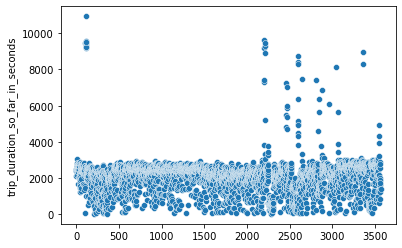

In [ ]:
sns.scatterplot(x=df_aux.index, y=df_aux['trip_duration_so_far_in_seconds'])

We can see that most trips have a duration of around 2000 seconds. The following boxplot shows it as well.

<AxesSubplot:ylabel='trip_duration_so_far_in_seconds'>

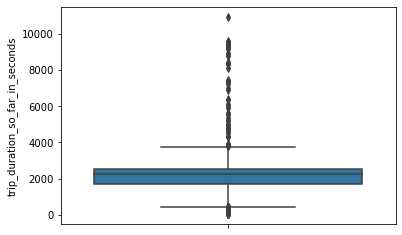

In [ ]:
sns.boxplot(y=df_aux['trip_duration_so_far_in_seconds'])

In [ ]:
df.columns

Index(['trip_id', 'date', 'day_of_week', 'route_id', 'direction_id', 'stop_id',
       'stop_sequence', 'first_stop', 'previous_stop', 'start_time',
       'start_time_hour', 'start_time_minute', 'arrival_time',
       'trip_duration_so_far_in_seconds', 'start_time_in_minutes',
       'day_of_week_number', 'weekend'],
      dtype='object')

We now analyse the target data regarding the days of the week. In the first plot we can see that Fridays have longer trips, but they are still considered outliers.

<AxesSubplot:xlabel='day_of_week', ylabel='trip_duration_so_far_in_seconds'>

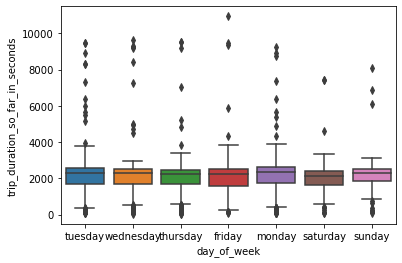

In [ ]:
sns.boxplot(x=df_aux['day_of_week'], y=df_aux['trip_duration_so_far_in_seconds'])

We can also see that some trips are longer than others, depending on where they start.

<AxesSubplot:xlabel='trip_duration_so_far_in_seconds', ylabel='first_stop'>

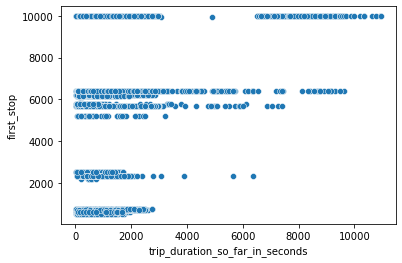

In [ ]:
sns.scatterplot(x=df['trip_duration_so_far_in_seconds'], y=df['first_stop'])

**Conclusions from plots:**
- First_stop might help the model

### Modeling

First we need to split our data into training and testing sets. We will check how much data we have for each day and split it in a chronological way to make sure that we don't train on data from the future to predict the past. We leave the last week for test data and the first two weeks for train data.

#### Splitting into training and testing datasets

In [ ]:
df.date.value_counts(sort=False)

2021-09-06    2360
2021-09-07    2914
2021-09-08    2651
2021-09-09    2585
2021-09-10    2668
2021-09-11    2046
2021-09-12    2033
2021-09-13    2468
2021-09-14    2772
2021-09-15    2614
2021-09-16    2899
2021-09-17    2602
2021-09-20    3157
2021-09-21    1973
Name: date, dtype: int64

In [ ]:
split_date = '2021-09-15'

train = df[df.date < split_date]
test = df[df.date >= split_date]

print(f'Train dataset:\t{train.shape[0]} rows, dates ranging from {train.date.min()} to {train.date.max()}')
print(f'Test dataset:\t{test.shape[0]} rows, dates ranging from {test.date.min()} to {test.date.max()}')

Train dataset:	22497 rows, dates ranging from 2021-09-06 to 2021-09-14
Test dataset:	13245 rows, dates ranging from 2021-09-15 to 2021-09-21


Now we define the feature we want to use in our models and prepare to compare them.

For comparison, we check the R-squared results of the training set, the R-squared results of the testing set (to check for overfitting), and the RMSE and MAE results for the testing set. We then plot the residues to analyze the models' weaknesses.

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
predictors = ['day_of_week_number', 'direction_id', 'stop_id',
       'stop_sequence', 'first_stop', 'start_time_in_minutes']

target = 'trip_duration_so_far_in_seconds'

In [ ]:
X = train[predictors]
y = train[target]

X_test = test[predictors]
y_test = test[target]

#### Baseline model: Linear Regression

Linear Regression base-model results:
	Training R2 score: 0.5925
	Testing  R2 score: 0.5056
	RMSE: 695.7185
	MAE:  342.4798


<AxesSubplot:ylabel='trip_duration_so_far_in_seconds'>

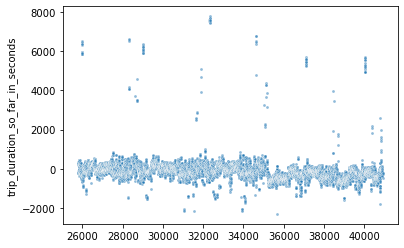

In [ ]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression(normalize=True, n_jobs=-1)

lr.fit(X, y)

y_pred = lr.predict(X_test)
print('Linear Regression base-model results:')
print(f'\tTraining R2 score: {lr.score(X, y):.4f}')
print(f'\tTesting  R2 score: {lr.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

sns.scatterplot(x=y_test.index, y=y_test - y_pred, alpha=0.5, marker='.')

#### Decision Tree based model: Random Forest Regressor

Linear Regression base-model results:
	Training R2 score: 0.9910
	Testing  R2 score: 0.8776
	RMSE: 346.2137
	MAE:  175.4266


<AxesSubplot:ylabel='trip_duration_so_far_in_seconds'>

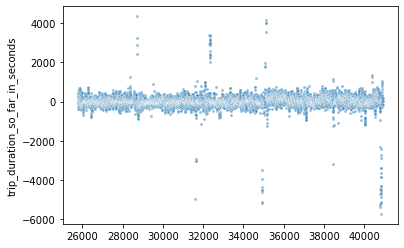

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(random_state=0, n_jobs=-1)

rf.fit(X, y)

y_pred = rf.predict(X_test)
print('Linear Regression base-model results:')
print(f'\tTraining R2 score: {rf.score(X, y):.4f}')
print(f'\tTesting  R2 score: {rf.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

sns.scatterplot(x=y_test.index, y=y_test - y_pred, alpha=0.5, marker='.')

From both results above we choose the Random Forest Regressor as our model. Since we only applied a default model without changing its hyperparameters, we proceed to work on hyperparameter optimization.

#### Optimizing/tuning hyperparameters for RandomForestRegressor

Now that we have baselines for our model, the next step is to do hyperparameter optimizing. That will include using some sort of cross validation strategy and some sort of search method.

First we need to define our cross validation method to be a TimeSeriesSplit, since it will account for the temporal aspect of the data. It doesn't make sense to train on data from the future to predict the past, so the cross validation strategy is as follows:

![Cat](../img/timeseriessplit.png)

In order to optimize our hyperparameters we select a subset of reasonable values for some of them and optimize them using GridSearch, that checks all possible values and maximizes the negative root mean sqaured error.

Before optimizing, let us check the default hyperparameters used.

In [ ]:
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


```python
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
import numpy as np

param_grid = {
    'max_depth': [3, 9, 12, None], # Maximum number of levels in tree
    'min_samples_leaf': [1, 2, 4], # Minimum number of samples required at each leaf node
    'min_samples_split': [2, 5, 10], # Minimum number of samples required to split a node
    'n_estimators': [100, 300, 500] # Number of trees in random forest
}

# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                           cv = TimeSeriesSplit(n_splits=2),
                           scoring='neg_root_mean_squared_error', 
                           n_jobs = -1, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X, y)

print('Best parameters obtained from the GridSearch:')
pprint(grid_search.best_params_)
```

In [ ]:
params = {'max_depth': 12,
          'min_samples_leaf': 1,
          'min_samples_split': 2,
          'n_estimators': 100,
          'random_state':0,
          'n_jobs':-1}

Now let us compare the base model with the optimized one:

In [ ]:
base_model = RandomForestRegressor(random_state=0, n_jobs=-1)
base_model.fit(X, y)
y_pred = base_model.predict(X_test)
print('Base model results:')
print(f'\tTraining R2 score: {base_model.score(X, y):.4f}')
print(f'\tTesting  R2 score: {base_model.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

# best_grid = grid_search.best_estimator_
best_grid = RandomForestRegressor(**params)
best_grid.fit(X, y)
y_pred = best_grid.predict(X_test)
print('Optimized model results:')
print(f'\tTraining R2 score: {best_grid.score(X, y):.4f}')
print(f'\tTesting  R2 score: {best_grid.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

Base model results:
	Training R2 score: 0.9910
	Testing  R2 score: 0.8776
	RMSE: 346.2137
	MAE:  175.4266
Optimized model results:
	Training R2 score: 0.9672
	Testing  R2 score: 0.8767
	RMSE: 347.4172
	MAE:  169.8080


The optimized parameters perform better for the test dataset.
Our mean absolute error is 170 seconds.

### Final function

Now let us build a function that receives the vehicle start time and a given stop and outputs the arrival time forecasting.

In [ ]:
import numpy as np
from datetime import timedelta

def arrival_time_forecast(date, start_time, stop_id):
    valid_stop_ids = df_raw.stop_id.unique()
    
    if stop_id not in valid_stop_ids:
        raise Exception(f'Invalid stop id. Valid stop_ids: {df_raw.stop_id.unique()}')
        
    stop_sequence = df_raw[(df_raw.stop_id == stop_id)]['stop_sequence'].unique()
    first_stop = df[(df.stop_id == stop_id)]['first_stop'].unique()[0]
    direction_id = df[(df.stop_id == stop_id)]['direction_id'].unique()[0]
    
    if len(stop_sequence) == 0:
        raise Exception('Invalid direction_id')
    else:
        stop_sequence = stop_sequence[0]
    
    X_pred = {'day_of_week_number':date.day_of_week, 'direction_id':direction_id, 'stop_id':stop_id, 'stop_sequence': stop_sequence, 'first_stop':first_stop, 'start_time_in_minutes':(start_time.hour * 60 + start_time.minute)}
    prediction = best_grid.predict(np.array(list(X_pred.values())).reshape(1, -1))
    
    arrival_time = start_time + timedelta(seconds=prediction[0])

    return arrival_time

In [ ]:
# Inputs
today = pd.Timestamp.today()
start_time = pd.Timestamp(2021,12,20,10,0,0)
stop_id = 6209
direction_id = 5776

# Calling the function
arrival_time_forecast(today, start_time, stop_id)

Timestamp('2021-12-20 10:02:04.652477')

### Modeling more lines and final pipeline

To model more lines, we use the same strategy as the ones used above. As an example, let us model one more line (Line 2).

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
df_raw = pd.read_csv('../data/preprocessed/SeveralLines.csv')

In [ ]:
df_raw = df_raw[df_raw.route_id == 2].reset_index()

In [ ]:
# Obtain first stop and arrival time in first stop
df_aux = df_raw.iloc[sorted(df_raw.groupby(['trip_id','date'])['stop_sequence'].idxmin())][['trip_id', 'date', 'stop_id', 'arrival_time']]
df_aux = df_aux.rename(columns={'arrival_time':'start_time', 'stop_id':'first_stop'})

df = df_raw.merge(df_aux, on=['trip_id', 'date'])

del df_aux

# Convert times to datetime type
df['start_time'] = pd.to_datetime(df['start_time'], format='%H:%M:%S.%f')
df['arrival_time'] = pd.to_datetime(df['arrival_time'], format='%H:%M:%S.%f')

df['start_time_in_minutes'] = df['start_time'].dt.hour * 60 + df['start_time'].dt.minute

df['trip_duration_so_far_in_seconds'] = (df['arrival_time'] - df['start_time']).dt.seconds

In [ ]:
# Exclude rows for the first stop, since we don't need to forecast the arrival time for it
df = df[df.stop_sequence != 1]

# Exclude rows where the start time is greater than the arrival time 
# (which indicates the trip actually didn't begin in the same day
df = df[df.start_time < df.arrival_time]

# Exclude rows with delay grater than 1 hour, they must be errors in the dataset
df = df[df.delay < 60*60]

In [ ]:
# day_of_week label encoding
df['day_of_week_number'] = 0
df.loc[df['day_of_week'] == 'monday', 'day_of_week_number'] = 1
df.loc[df['day_of_week'] == 'tuesday', 'day_of_week_number'] = 2
df.loc[df['day_of_week'] == 'wednesday', 'day_of_week_number'] = 3
df.loc[df['day_of_week'] == 'thursday', 'day_of_week_number'] = 4
df.loc[df['day_of_week'] == 'friday', 'day_of_week_number'] = 5
df.loc[df['day_of_week'] == 'saturday', 'day_of_week_number'] = 6
df.loc[df['day_of_week'] == 'sunday', 'day_of_week_number'] = 7

In [ ]:
df.date.value_counts(sort=False)

2021-09-06    3189
2021-09-07    3709
2021-09-08    3614
2021-09-09    3574
2021-09-10    3597
2021-09-11    2896
2021-09-12    3066
2021-09-13    3586
2021-09-14    3493
2021-09-15    3749
2021-09-16    3815
2021-09-17    3336
2021-09-18    2942
2021-09-19    3255
2021-09-20    3517
2021-09-21    2491
Name: date, dtype: int64

In [ ]:
split_date = '2021-09-15'

train = df[df.date < split_date]
test = df[df.date >= split_date]

print(f'Train dataset:\t{train.shape[0]} rows, dates ranging from {train.date.min()} to {train.date.max()}')
print(f'Test dataset:\t{test.shape[0]} rows, dates ranging from {test.date.min()} to {test.date.max()}')

Train dataset:	30724 rows, dates ranging from 2021-09-06 to 2021-09-14
Test dataset:	23105 rows, dates ranging from 2021-09-15 to 2021-09-21


In [ ]:
predictors = ['day_of_week_number', 'direction_id', 'stop_id',
       'stop_sequence', 'first_stop', 'start_time_in_minutes']

target = 'trip_duration_so_far_in_seconds'

X = train[predictors]
y = train[target]

X_test = test[predictors]
y_test = test[target]

In [ ]:
params = {'max_depth': 12,
          'min_samples_leaf': 1,
          'min_samples_split': 2,
          'n_estimators': 100,
          'random_state':0,
          'n_jobs':-1}

In [ ]:
base_model = RandomForestRegressor(random_state=0, n_jobs=-1)
base_model.fit(X, y)
y_pred = base_model.predict(X_test)
print('Base model results:')
print(f'\tTraining R2 score: {base_model.score(X, y):.4f}')
print(f'\tTesting  R2 score: {base_model.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

Base model results:
	Training R2 score: 0.9783
	Testing  R2 score: 0.8520
	RMSE: 151.8225
	MAE:  104.8204


In [ ]:
best_grid = RandomForestRegressor(**params)
best_grid.fit(X, y)
y_pred = best_grid.predict(X_test)
print('Optimized model results:')
print(f'\tTraining R2 score: {best_grid.score(X, y):.4f}')
print(f'\tTesting  R2 score: {best_grid.score(X_test, y_test):.4f}')
print(f'\tRMSE: {mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False):.4f}')
print(f'\tMAE:  {mean_absolute_error(y_true=y_test, y_pred=y_pred):.4f}')

Optimized model results:
	Training R2 score: 0.9063
	Testing  R2 score: 0.8752
	RMSE: 139.4427
	MAE:  96.7618


We have ran the model for all the data and put the route_id as a column, but the results were much worse (shown below), therefore the strategy taken was to model each line separately.
```
All lines model results:
	Training R2 score: 0.9820
	Testing  R2 score: 0.3571
	RMSE: 1007.1266
	MAE:  440.8438
```

In [ ]:
from datetime import timedelta

def arrival_time_forecast(date, start_time, stop_id):
    valid_stop_ids = df_raw.stop_id.unique()
    
    if stop_id not in valid_stop_ids:
        raise Exception(f'Invalid stop id. Valid stop_ids: {df_raw.stop_id.unique()}')
        
    stop_sequence = df_raw[(df_raw.stop_id == stop_id)]['stop_sequence'].unique()
    first_stop = df[(df.stop_id == stop_id)]['first_stop'].unique()[0]
    direction_id = df[(df.stop_id == stop_id)]['direction_id'].unique()[0]
    
    if len(stop_sequence) == 0:
        raise Exception('Invalid direction_id')
    else:
        stop_sequence = stop_sequence[0]
    
    X_pred = {'day_of_week_number':date.day_of_week, 'direction_id':direction_id, 'stop_id':stop_id, 'stop_sequence': stop_sequence, 'first_stop':first_stop, 'start_time_in_minutes':(start_time.hour * 60 + start_time.minute)}
    prediction = best_grid.predict(np.array(list(X_pred.values())).reshape(1, -1))
    
    arrival_time = start_time + timedelta(seconds=prediction[0])

    return arrival_time

In [ ]:
# Inputs
today = pd.Timestamp.today()
start_time = pd.Timestamp(2021,12,20,10,0,0)
stop_id = 8461
direction_id = 8763

# Calling the function
arrival_time_forecast(today, start_time, stop_id)

Timestamp('2021-12-20 10:02:11.941914')

## Task 4 (infer mode of transportation from GPS tracks)

# INFER TRANSPORT TYPE FROM GPS TRACKS

The data for this task is composed by some GPS tracks taken by real people moving in Brussels. The aim is to classify each GPS track with the corresponding transport type between {bus, tram, metro, other}. The last option is because there might be tracks that neither used bus, tram, nor metro (possibly walking, car, etc). A track starts and ends at the start/end of the trip and uses only one transport mode. It is composed of different records, each of them describing a position at a point at a certain time.

The general idea for this problem is to compare the GPS track with the routes that the different transport types follow, using GTFS information. Since a GPS track represents one specific trip from the beginning to the end, we expect it to be closer to a specific route than to the others. Moreover, it is very unlikely that two transports of different types do exactly the same route for the whole trip. The empirical results obtained from these few GPS tracks seem to confirm this.

Each GPS track could be compared with all the trips' routes, producing a list of distance values. The distance between two lines is computed by summing out all the distances between the original route line and each point in the provided GPS track. It is possible to state that this simple distance measure can produce a small result even if the two lines are not really similar (for instance, imagine a GPS track around a particular stop of a line: in this case, all the distances between the line and the GPS track will be small even if the general path of the two tracks is completely different). However, empirical results have shown that similar tracks are able to produce a smaller result, this is why it was enough to define a threshold below which the distances are considered reliable.

- In case none of the three route types has a line with a distance from the GPS track smaller than the threshold, the output is "other" because it is very likely that the GPS track does not follow a public transport line.

- On the other hand, in case only one route type has line(s) with a distance smaller than the threshold, then it is possible to output the corresponding transport type without further analysis.

These two cases cover most of the GPS tracks (6 out of 9). Moreover, plotting the pair route-track (where route is the one with the minimum distance to the track) it is evident that the similarity is very high and the results could be considered reliable. However, we are not taking into account the departure or arrival time, nor the duration of the trip or the average speed. Therefore, some of the GPS tracks are classified with a route type only because they are close to the stops, even if the duration of the whole GPS track is 1 minute. In other words, this approach is not adequate if the requirements declare that a GPS track represents a full trip (from the start stop to the end stop). That is why we tried also to apply some filters using the GTFS files:
- <b>Filtering on time</b>: the schedule of all the trips is retrieved from the GTFS files. Since the time validity for the snapshots provided for this project does not cover the days when the GPS tracks are taken (from 2021/11/16 to 2021/11/21), the schedule is used without taking into account the day of the week nor the particular date but just looking at the time. This means that some of the filtered trips could not be present the day when a GPS track is recorded However, this check is anyway filtering out most of the trips that are not possible (e.g. all the night buses are excluded because the GPS tracks are taken from 8 am to 1 pm). Of course, the starting and ending time are approximated when compared with the GPS tracks' timestamps to consider possible delays.
- <b>Filtering on speed</b>: the expected speed of the vehicles is part of the GTFS files (this data is processed taking the minimum and the maximum speed for each line), therefore we only need to compute the speed from the GPS track. This is done by estimating the length of each segment of the provided GPS track (using the Haversine formula) and dividing the total length of the track by the duration (obtained from the timestamp of the track).

The results show that applying the second filter most of the problems explained before are fixed. However, we must also consider that the speed from the schedule, even if it probably takes into account different conditions (that is why we have more speed values for the same line), it cannot really represent the speed of the vehicle in case of delays or problems on the line. Moreover, the speed of the GPS track is computed with an approximate measure that could produce a non-precise value.

For the remaining tracks (i.e. those which have more than one route type with at least one line with a distance smaller than the threshold), although, it could be possible to consider the route type corresponding to the trip with the minimum distance as the classification for that particular GPS track. However, the best choices are visibly wrong because the chosen routes are "bigger" than the corresponding GPS tracks, i.e. they could be right only if the GPS track can represent also just a segment of the route, which is not the case.

In the end, the speed filter can be considered useful only when there is not a visible route type that is correct. Therefore, the best approach with the provided data seems to be the one filtering on time for all the GPS tracks and filtering on speed only in case there are more possible route types.

In [2]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
import gtfs_kit
from shapely.geometry import LineString, Point
from datetime import datetime, date

import warnings
warnings.filterwarnings("ignore")

GPS_CSV_PATH = "../data/original/GPStracks.csv"
SHAPEFILE_PATH = "../data/original/shapefiles23Sept/ACTU_LINES.shp"
GTFS_FILE_PATH = "../data/parsed/gtfs.zip"

gps_df = pd.read_csv(GPS_CSV_PATH)
gps_df

,TrackId,lat,lon,time
0,1,50.851152,4.345326,2021-11-16T08:35:24Z
1,1,50.851235,4.345191,2021-11-16T08:35:45Z
2,1,50.851328,4.345069,2021-11-16T08:35:48Z
3,1,50.851403,4.344988,2021-11-16T08:35:51Z
4,1,50.851500,4.344920,2021-11-16T08:35:55Z
...,...,...,...,...
1804,11,50.831512,4.404541,2021-11-21T12:06:07Z
1805,11,50.831625,4.404608,2021-11-21T12:06:08Z
1806,11,50.831739,4.404673,2021-11-21T12:06:09Z
1807,11,50.831854,4.404738,2021-11-21T12:06:10Z


In [3]:
# csv to sorted geodataframe
gps_df[ 'time' ] = pd.to_datetime( gps_df[ 'time' ] )
gps_df = geopandas.GeoDataFrame(gps_df, geometry=geopandas.points_from_xy(gps_df.lon, gps_df.lat))
gps_df.drop("lat", axis=1, inplace=True)
gps_df.drop("lon", axis=1, inplace=True)
gps_df.sort_values(by=['TrackId',  'time'], inplace=True)
gps_df

,TrackId,time,geometry
0,1,2021-11-16 08:35:24+00:00,POINT (4.34533 50.85115)
1,1,2021-11-16 08:35:45+00:00,POINT (4.34519 50.85124)
2,1,2021-11-16 08:35:48+00:00,POINT (4.34507 50.85133)
3,1,2021-11-16 08:35:51+00:00,POINT (4.34499 50.85140)
4,1,2021-11-16 08:35:55+00:00,POINT (4.34492 50.85150)
...,...,...,...
1804,11,2021-11-21 12:06:07+00:00,POINT (4.40454 50.83151)
1805,11,2021-11-21 12:06:08+00:00,POINT (4.40461 50.83163)
1806,11,2021-11-21 12:06:09+00:00,POINT (4.40467 50.83174)
1807,11,2021-11-21 12:06:10+00:00,POINT (4.40474 50.83185)


In [4]:
# grouping geodataframe by TrackId aggregating the coordinates into a LineString
gps_grouped = gps_df.groupby(['TrackId'])
gps_tracks = gps_grouped.agg(
    start_timestamp=pd.NamedAgg(column="time", aggfunc="min"),
    end_timestamp=pd.NamedAgg(column="time", aggfunc="max"),
)
gps_tracks["geometry"] = gps_grouped["geometry"].apply(lambda x: LineString(x.tolist()))
gps_tracks["duration"] = gps_tracks.end_timestamp - gps_tracks.start_timestamp

gps_tracks

,start_timestamp,end_timestamp,geometry,duration
TrackId,,,,
1,2021-11-16 08:35:24+00:00,2021-11-16 08:54:03+00:00,"LINESTRING (4.34533 50.85115, 4.34519 50.85124...",0 days 00:18:39
3,2021-11-18 09:19:40.181000+00:00,2021-11-18 09:23:56+00:00,"LINESTRING (4.33812 50.83648, 4.33855 50.83612...",0 days 00:04:15.819000
4,2021-11-18 09:24:58+00:00,2021-11-18 09:38:59+00:00,"LINESTRING (4.32621 50.82429, 4.32622 50.82420...",0 days 00:14:01
5,2021-11-18 09:52:05.354000+00:00,2021-11-18 10:04:29+00:00,"LINESTRING (4.31662 50.80199, 4.31641 50.80201...",0 days 00:12:23.646000
6,2021-11-18 10:39:22+00:00,2021-11-18 10:54:58+00:00,"LINESTRING (4.35504 50.83586, 4.35535 50.83557...",0 days 00:15:36
7,2021-11-21 12:43:09+00:00,2021-11-21 12:52:32+00:00,"LINESTRING (4.40431 50.83192, 4.40442 50.83181...",0 days 00:09:23
8,2021-11-21 12:52:50+00:00,2021-11-21 13:04:21+00:00,"LINESTRING (4.37706 50.81549, 4.37688 50.81542...",0 days 00:11:31
10,2021-11-21 11:36:13+00:00,2021-11-21 11:37:42+00:00,"LINESTRING (4.36135 50.82966, 4.36146 50.82956...",0 days 00:01:29
11,2021-11-21 11:59:01.428000+00:00,2021-11-21 12:06:11+00:00,"LINESTRING (4.38407 50.81456, 4.38373 50.81431...",0 days 00:07:09.572000


<AxesSubplot:>

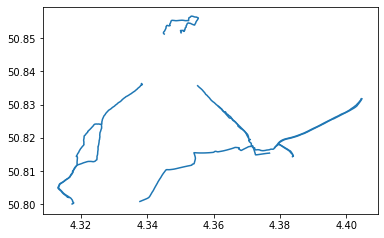

In [5]:
gps_tracks = geopandas.GeoDataFrame(gps_tracks, geometry='geometry')
gps_tracks.plot()

,route_id,geometry,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color
0,1,"MULTILINESTRING ((4.32277 50.85343, 4.32246 50...",5,ERASME - HERRMANN-DEBROUX,NaN,1,NaN,E6B012,FFFFFF
1,10,"MULTILINESTRING ((4.31874 50.79527, 4.31862 50...",4,GARE DU NORD - STALLE (P),NaN,0,NaN,F25482,000000
2,11,"MULTILINESTRING ((4.35319 50.83721, 4.35327 50...",8,LOUISE - ROODEBEEK,NaN,0,NaN,0098D4,FFFFFF


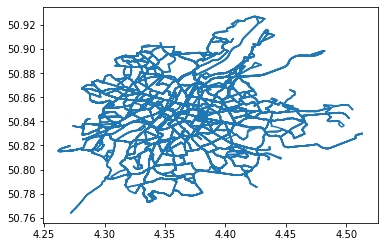

In [6]:
# ATTEMPT WITH GTFS FILES
gtfs = gtfs_kit.read_feed(GTFS_FILE_PATH, dist_units='m')

routes = gtfs.geometrize_routes()
routes.plot()
routes.head(3)

In [7]:
%%time

trip_stats = gtfs_kit.trips.compute_trip_stats(gtfs)

trip_stats

CPU times: user 1min 36s, sys: 2.23 s, total: 1min 38s
Wall time: 1min 40s


,trip_id,route_id,route_short_name,route_type,direction_id,shape_id,num_stops,start_time,end_time,start_stop_id,end_stop_id,is_loop,duration,distance,speed
22378,112588490234578052,1,5,1,0,005m0144,28,05:09:31,05:53:26,8642,8262,0,0.731944,18.839416,25.738860
39894,112952681236270000,1,5,1,0,005m0144,28,05:11:11,05:55:06,8642,8262,0,0.731944,18.839416,25.738860
38581,112949489236269500,1,5,1,0,005m0144,28,05:12:46,05:48:03,8642,8262,0,0.588056,18.839416,32.036796
102584,113347168237566502,1,5,1,0,005m0144,28,05:12:46,05:48:03,8642,8262,0,0.588056,18.839416,32.036796
94167,113321715237476501,1,5,1,0,005m0092,19,05:25:00,05:52:58,8733,8262,0,0.466111,11.295787,24.234108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128006,113493210238255501,98,NAV,3,1,073b0010,3,18:02:00,18:09:00,4264B,2341,0,0.116667,1.570191,13.458781
128007,113493211238255501,98,NAV,3,1,073b0010,3,18:15:00,18:22:00,4264B,2341,0,0.116667,1.570191,13.458781
128008,113493212238255501,98,NAV,3,1,073b0010,3,18:35:00,18:42:00,4264B,2341,0,0.116667,1.570191,13.458781
128009,113493213238255501,98,NAV,3,1,073b0010,3,18:55:00,19:02:00,4264B,2341,0,0.116667,1.570191,13.458781


In [8]:
# filtering out all the trips outside of the range [06:00, 15:00]
trip_stats = trip_stats[trip_stats.start_time.str.split(":").str[0].astype(int)>6]\
    [trip_stats.start_time.str.split(":").str[0].astype(int)<15]\
    [trip_stats.end_time.str.split(":").str[0].astype(int)>6]\
    [trip_stats.end_time.str.split(":").str[0].astype(int)<15]

trip_stats["duration"] = pd.to_timedelta(trip_stats.duration, "hours")
trip_stats["start_time"] = pd.to_datetime(trip_stats.start_time).dt.time
trip_stats["end_time"] = pd.to_datetime(trip_stats.end_time).dt.time

trip_stats

,trip_id,route_id,route_short_name,route_type,direction_id,shape_id,num_stops,start_time,end_time,start_stop_id,end_stop_id,is_loop,duration,distance,speed
22355,112588394234578052,1,5,1,0,005m0144,28,07:02:11,07:39:45,8642,8262,0,0 days 00:37:33.999999600,18.839416,30.089573
38838,112949978236270000,1,5,1,0,005m0144,28,07:05:00,07:42:34,8642,8262,0,0 days 00:37:33.999999600,18.839416,30.089573
59898,113187524236986502,1,5,1,0,005m0125,28,07:07:58,07:42:04,8641,8262,0,0 days 00:34:05.999998800,18.897990,33.251595
61235,113190632236988602,1,5,1,0,005m0125,28,07:07:58,07:42:04,8641,8262,0,0 days 00:34:05.999998800,18.897990,33.251595
117461,113423466237269601,1,5,1,0,005m0125,28,07:07:58,07:42:04,8641,8262,0,0 days 00:34:05.999998800,18.897990,33.251595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127983,113493187238255501,98,NAV,3,1,073b0010,3,14:12:00,14:19:00,4264B,2341,0,0 days 00:07:00.000001200,1.570191,13.458781
127984,113493188238255501,98,NAV,3,1,073b0010,3,14:22:00,14:29:00,4264B,2341,0,0 days 00:07:00.000001200,1.570191,13.458781
127985,113493189238255501,98,NAV,3,1,073b0010,3,14:32:00,14:39:00,4264B,2341,0,0 days 00:07:00.000001200,1.570191,13.458781
127986,113493190238255501,98,NAV,3,1,073b0010,3,14:42:00,14:49:00,4264B,2341,0,0 days 00:07:00.000001200,1.570191,13.458781


In [9]:
# adding min, max and average duration for each route
route_durations = trip_stats.groupby("route_id", as_index=False).agg(
    min_duration=pd.NamedAgg(column="duration", aggfunc="min"),
    avg_duration=pd.NamedAgg(column="duration", aggfunc="mean"),
    max_duration=pd.NamedAgg(column="duration", aggfunc="max"),
)
routes = routes.merge(route_durations)
routes

,route_id,geometry,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color,min_duration,avg_duration,max_duration
0,1,"MULTILINESTRING ((4.32277 50.85343, 4.32246 50...",5,ERASME - HERRMANN-DEBROUX,NaN,1,NaN,E6B012,FFFFFF,0 days 00:03:37.000000800,0 days 00:34:10.281750578,0 days 00:37:33.999999600
1,10,"MULTILINESTRING ((4.31874 50.79527, 4.31862 50...",4,GARE DU NORD - STALLE (P),NaN,0,NaN,F25482,000000,0 days 00:06:00,0 days 00:31:30.633802902,0 days 00:34:59.999998800
2,11,"MULTILINESTRING ((4.35319 50.83721, 4.35327 50...",8,LOUISE - ROODEBEEK,NaN,0,NaN,0098D4,FFFFFF,0 days 00:06:00,0 days 00:33:28.552278778,0 days 00:51:00
3,12,"MULTILINESTRING ((4.32919 50.86375, 4.32921 50...",9,SIMONIS - ARBRE BALLON,NaN,0,NaN,CD5599,FFFFFF,0 days 00:10:59.999998800,0 days 00:13:45.933013647,0 days 00:13:59.999998800
4,13,"MULTILINESTRING ((4.35504 50.89525, 4.35494 50...",19,GROOT-BIJGAARDEN - DE WAND,NaN,0,NaN,DE3B21,FFFFFF,0 days 00:03:00,0 days 00:25:12.207293949,0 days 00:34:00.000001200
...,...,...,...,...,...,...,...,...,...,...,...,...
80,94,"MULTILINESTRING ((4.37388 50.78952, 4.37384 50...",T92,SCHAERBEEK GARE - FORT-JACO,NaN,3,NaN,DE3B21,FFFFFF,0 days 00:07:00.000001200,0 days 00:17:24.722439060,0 days 00:22:59.999998800
81,95,"MULTILINESTRING ((4.37896 50.81870, 4.37838 50...",T7,VANDERKINDERE - HEYSEL,NaN,3,NaN,ECE354,000000,0 days 00:09:00,0 days 00:11:07.931769986,0 days 00:24:00
82,96,"MULTILINESTRING ((4.39717 50.85470, 4.39723 50...",T25,BOONDAEL GARE - ROGIER,NaN,3,NaN,991F36,FFFFFF,0 days 00:18:00,0 days 00:21:26.322580521,0 days 00:25:59.999998800
83,97,"MULTILINESTRING ((4.32519 50.78015, 4.32482 50...",T51,STADE - VAN HAELEN,NaN,3,NaN,E3BA12,000000,0 days 00:07:00.000001200,0 days 00:07:16.271186989,0 days 00:07:59.999998800


In [10]:
# adding min, max and average speed for each route
route_speeds = trip_stats.groupby("route_id", as_index=False).agg(
    min_speed=pd.NamedAgg(column="speed", aggfunc="min"),
    avg_speed=pd.NamedAgg(column="speed", aggfunc="mean"),
    max_speed=pd.NamedAgg(column="speed", aggfunc="max"),
)
routes = routes.merge(route_speeds)
routes

,route_id,geometry,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color,min_duration,avg_duration,max_duration,min_speed,avg_speed,max_speed
0,1,"MULTILINESTRING ((4.32277 50.85343, 4.32246 50...",5,ERASME - HERRMANN-DEBROUX,NaN,1,NaN,E6B012,FFFFFF,0 days 00:03:37.000000800,0 days 00:34:10.281750578,0 days 00:37:33.999999600,27.815169,30.975551,35.490828
1,10,"MULTILINESTRING ((4.31874 50.79527, 4.31862 50...",4,GARE DU NORD - STALLE (P),NaN,0,NaN,F25482,000000,0 days 00:06:00,0 days 00:31:30.633802902,0 days 00:34:59.999998800,15.025589,18.439748,20.700988
2,11,"MULTILINESTRING ((4.35319 50.83721, 4.35327 50...",8,LOUISE - ROODEBEEK,NaN,0,NaN,0098D4,FFFFFF,0 days 00:06:00,0 days 00:33:28.552278778,0 days 00:51:00,11.536808,17.295828,21.104658
3,12,"MULTILINESTRING ((4.32919 50.86375, 4.32921 50...",9,SIMONIS - ARBRE BALLON,NaN,0,NaN,CD5599,FFFFFF,0 days 00:10:59.999998800,0 days 00:13:45.933013647,0 days 00:13:59.999998800,17.266660,17.984919,19.300186
4,13,"MULTILINESTRING ((4.35504 50.89525, 4.35494 50...",19,GROOT-BIJGAARDEN - DE WAND,NaN,0,NaN,DE3B21,FFFFFF,0 days 00:03:00,0 days 00:25:12.207293949,0 days 00:34:00.000001200,13.719413,17.303051,22.919203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,94,"MULTILINESTRING ((4.37388 50.78952, 4.37384 50...",T92,SCHAERBEEK GARE - FORT-JACO,NaN,3,NaN,DE3B21,FFFFFF,0 days 00:07:00.000001200,0 days 00:17:24.722439060,0 days 00:22:59.999998800,9.079585,11.538861,19.245472
81,95,"MULTILINESTRING ((4.37896 50.81870, 4.37838 50...",T7,VANDERKINDERE - HEYSEL,NaN,3,NaN,ECE354,000000,0 days 00:09:00,0 days 00:11:07.931769986,0 days 00:24:00,10.465777,11.940287,18.165516
82,96,"MULTILINESTRING ((4.39717 50.85470, 4.39723 50...",T25,BOONDAEL GARE - ROGIER,NaN,3,NaN,991F36,FFFFFF,0 days 00:18:00,0 days 00:21:26.322580521,0 days 00:25:59.999998800,13.160072,15.044607,18.008520
83,97,"MULTILINESTRING ((4.32519 50.78015, 4.32482 50...",T51,STADE - VAN HAELEN,NaN,3,NaN,E3BA12,000000,0 days 00:07:00.000001200,0 days 00:07:16.271186989,0 days 00:07:59.999998800,16.360963,18.224697,19.013484


In [11]:
trip_stats.groupby("route_id").agg(
    min_speed = pd.NamedAgg(column="speed", aggfunc="min"),
    max_speed = pd.NamedAgg(column="speed", aggfunc="max")
)

from math import radians, cos, sin, asin, sqrt

def length_between(points):
    length = 0
    for i in range(len(points)-1):
        a = points[i]
        b = points[i+1]
        length += haversine(a[0], a[1], b[0], b[1])
    return length

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

gps_tracks["length_km"] = gps_tracks.apply(lambda x: length_between(x.geometry.coords), axis=1)
gps_tracks["speed"] = gps_tracks.apply(lambda x: ( x.length_km / (x.duration.seconds/3600)), axis=1)
gps_tracks
    

,start_timestamp,end_timestamp,geometry,duration,length_km,speed
TrackId,,,,,,
1,2021-11-16 08:35:24+00:00,2021-11-16 08:54:03+00:00,"LINESTRING (4.34533 50.85115, 4.34519 50.85124...",0 days 00:18:39,2.212084,7.116624
3,2021-11-18 09:19:40.181000+00:00,2021-11-18 09:23:56+00:00,"LINESTRING (4.33812 50.83648, 4.33855 50.83612...",0 days 00:04:15.819000,1.643385,23.200725
4,2021-11-18 09:24:58+00:00,2021-11-18 09:38:59+00:00,"LINESTRING (4.32621 50.82429, 4.32622 50.82420...",0 days 00:14:01,3.199399,13.695408
5,2021-11-18 09:52:05.354000+00:00,2021-11-18 10:04:29+00:00,"LINESTRING (4.31662 50.80199, 4.31641 50.80201...",0 days 00:12:23.646000,3.072005,14.884547
6,2021-11-18 10:39:22+00:00,2021-11-18 10:54:58+00:00,"LINESTRING (4.35504 50.83586, 4.35535 50.83557...",0 days 00:15:36,3.762548,14.471340
7,2021-11-21 12:43:09+00:00,2021-11-21 12:52:32+00:00,"LINESTRING (4.40431 50.83192, 4.40442 50.83181...",0 days 00:09:23,2.556350,16.346108
8,2021-11-21 12:52:50+00:00,2021-11-21 13:04:21+00:00,"LINESTRING (4.37706 50.81549, 4.37688 50.81542...",0 days 00:11:31,4.311284,22.461103
10,2021-11-21 11:36:13+00:00,2021-11-21 11:37:42+00:00,"LINESTRING (4.36135 50.82966, 4.36146 50.82956...",0 days 00:01:29,1.276462,51.632188
11,2021-11-21 11:59:01.428000+00:00,2021-11-21 12:06:11+00:00,"LINESTRING (4.38407 50.81456, 4.38373 50.81431...",0 days 00:07:09.572000,2.985470,25.052892


In [12]:
THRESHOLD = 0.1

MAX_DELAY = pd.Timedelta(15, "minutes")

def distance_lines(from_line: LineString, to_line: LineString):
    dists = list()
    for coord in from_line.coords:
        point = Point(coord)
        dist = to_line.distance(point)
        dists.append(dist)
    
    return sum(dists)

def route_ids_compatible_with_speed(speed):
    filtering = routes[routes.min_speed < speed] \
        [speed < routes.max_speed]
    return set(filtering["route_id"])

def route_ids_compatible_with_duration(duration):
    filtering = routes[routes.min_duration < duration] \
        [duration < routes.max_duration]
    return set(filtering["route_id"])

def route_ids_compatible_with_time(start_time, end_time):
    start_time, end_time = approximate(start_time, end_time)
    filtering = trip_stats[trip_stats.start_time > start_time]\
        [trip_stats.end_time < end_time]
    return set(filtering["route_id"])

def approximate(start_time, end_time):
    start_time = subtract(start_time, MAX_DELAY)
    end_time = add(end_time, MAX_DELAY)
    return start_time, end_time

def subtract(time, timedelta):
    return (datetime.combine(date.today(), time) - timedelta).time()

def add(time, timedelta):
    return (datetime.combine(date.today(), time) + timedelta).time()

def plot_comparison_min_dist(dist_comp_pairs):
    min_dist = min([dist for dist, _ in dist_comp_pairs])
    for dist, comparison in dist_comp_pairs:
        if dist==min_dist:
            comparison.plot(color=comparison.color)
            break


def compare_tracks_routes(filter_on_speed, filter_on_duration, filter_on_time):
    for gps_track in gps_tracks.itertuples():
    #for gps_track in [gps_tracks.iloc[1], gps_tracks.iloc[5], gps_tracks.iloc[8]]:
        type_to_distances = {0: [], 1: [], 3: []}

        # possibly filter out some routes
        possible_route_ids = set(routes.route_id.unique())
        if filter_on_speed:
            filtered = route_ids_compatible_with_speed(gps_track.speed)
            possible_route_ids &= filtered
        if filter_on_duration:
            filtered = route_ids_compatible_with_duration(gps_track.duration)
            possible_route_ids &= filtered
        if filter_on_time:
            filtered = route_ids_compatible_with_time(gps_track.start_timestamp.time(), gps_track.end_timestamp.time())
            possible_route_ids &= filtered
        
        filtered_routes = routes[routes.route_id.isin(possible_route_ids)]

        # check all lines from shapefile
        for multiline in filtered_routes.itertuples():
            route_type = multiline.route_type
            if isinstance(multiline.geometry, LineString):
                lines = [multiline.geometry]
            else:
                lines = multiline.geometry.geoms
            for line in lines:
                distance = distance_lines(gps_track.geometry, line)
                if distance > THRESHOLD:
                    continue

                d = {'geometry': [gps_track.geometry, line], 'color': ['blue', 'green']}
                comparison = geopandas.GeoDataFrame(d)

                type_to_distances[route_type].append((distance, comparison))

        # OTHER
        if not type_to_distances[0] and not type_to_distances[1] and not type_to_distances[3]:
            print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'other'")
        # BUS
        elif not type_to_distances[0] and not type_to_distances[1]:
            print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'bus'")
            #print(f"distances={[dist for dist, _ in type_to_distances[3]]}")
            plot_comparison_min_dist(type_to_distances[3])
        # METRO
        elif not type_to_distances[0] and not type_to_distances[3]:
            print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'metro'")
            #print(f"distances={[dist for dist, _ in type_to_distances[1]]}")
            plot_comparison_min_dist(type_to_distances[1])
        # TRAM
        elif not type_to_distances[1] and not type_to_distances[3]:
            print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'tram'")
            #print(f"distances={[dist for dist, _ in type_to_distances[0]]}")
            plot_comparison_min_dist(type_to_distances[0])
        # MORE POSSIBLE TYPES
        else:
            print("[Different possible types]")
            min_tram = min([dist for dist, _ in type_to_distances[0]], default=999)
            min_metro = min([dist for dist, _ in type_to_distances[1]], default=999)
            min_bus = min([dist for dist, _ in type_to_distances[3]], default=999)
            
            min_type = min([0, 1, 2], key=[min_tram, min_metro, min_bus].__getitem__)
            if min_type==0:
                print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'tram'")
                #print(f"distances={[dist for dist, _ in type_to_distances[0]]}")
                plot_comparison_min_dist(type_to_distances[0])
            elif min_type==1:
                print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'metro'")
                #print(f"distances={[dist for dist, _ in type_to_distances[1]]}")
                plot_comparison_min_dist(type_to_distances[1])
            elif min_type==2:
                print(f"The GPS track with TrackId:{gps_track.Index} is classified as 'bus'")
                #print(f"distances={[dist for dist, _ in type_to_distances[3]]}")
                plot_comparison_min_dist(type_to_distances[3])
        
        print()

The GPS track with TrackId:1 is classified as 'other'

[Different possible types]
The GPS track with TrackId:3 is classified as 'tram'

The GPS track with TrackId:4 is classified as 'bus'

The GPS track with TrackId:5 is classified as 'tram'

The GPS track with TrackId:6 is classified as 'tram'

[Different possible types]
The GPS track with TrackId:7 is classified as 'tram'

The GPS track with TrackId:8 is classified as 'other'

The GPS track with TrackId:10 is classified as 'tram'

[Different possible types]
The GPS track with TrackId:11 is classified as 'tram'



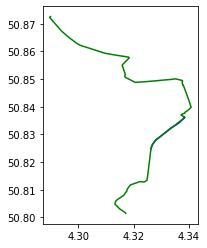

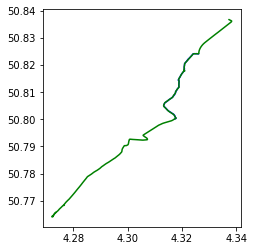

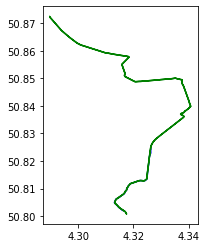

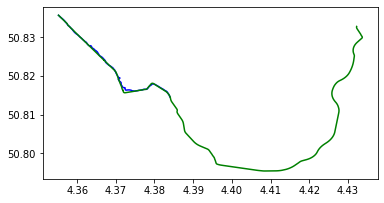

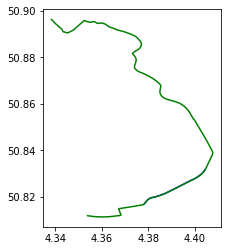

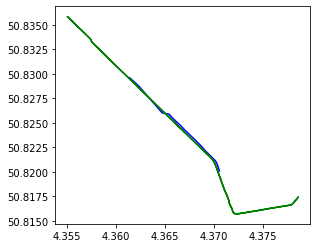

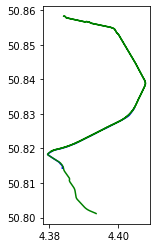

In [13]:
compare_tracks_routes(
    filter_on_speed=False,
    filter_on_duration=False,
    filter_on_time=True
)

The GPS track with TrackId:1 is classified as 'other'

The GPS track with TrackId:3 is classified as 'other'

The GPS track with TrackId:4 is classified as 'bus'

The GPS track with TrackId:5 is classified as 'tram'

The GPS track with TrackId:6 is classified as 'tram'

[Different possible types]
The GPS track with TrackId:7 is classified as 'tram'

The GPS track with TrackId:8 is classified as 'other'

The GPS track with TrackId:10 is classified as 'other'

The GPS track with TrackId:11 is classified as 'tram'



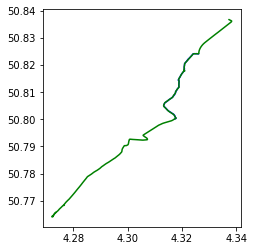

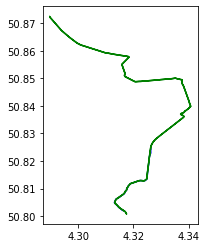

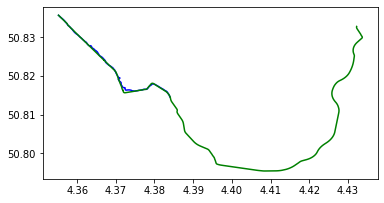

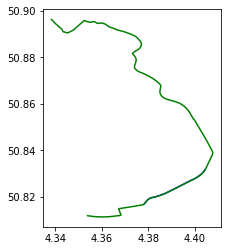

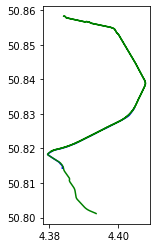

In [14]:
compare_tracks_routes(
    filter_on_speed=False,
    filter_on_duration=True,
    filter_on_time=True
)

The GPS track with TrackId:1 is classified as 'other'

The GPS track with TrackId:3 is classified as 'other'

The GPS track with TrackId:4 is classified as 'other'

The GPS track with TrackId:5 is classified as 'tram'

The GPS track with TrackId:6 is classified as 'tram'

[Different possible types]
The GPS track with TrackId:7 is classified as 'tram'

The GPS track with TrackId:8 is classified as 'other'

The GPS track with TrackId:10 is classified as 'other'

The GPS track with TrackId:11 is classified as 'other'



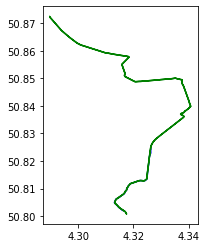

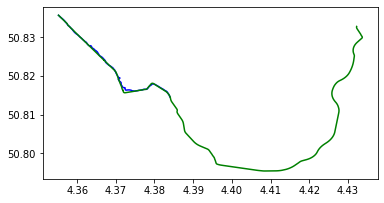

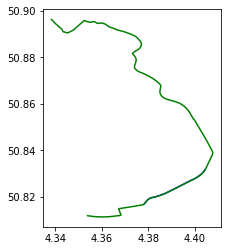

In [15]:
compare_tracks_routes(
    filter_on_speed=True,
    filter_on_duration=True,
    filter_on_time=True
)

## Final remarks